# Network Analysis Project
# Author: Byron O'Gorman
## Task 1: Follower Network
Process Twitter Follower data from some of the top Football clubs in Europe

In [1]:
from collections import Counter
import itertools, json
import networkx as nx
import pandas as pd
# visualization imports
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
from datetime import datetime, timedelta

In [2]:
follower_data = pd.read_csv("data/followers.csv", delimiter="\t", parse_dates=["date"])
follower_data

,source,target,date
0,dundeeunitedfc,southamptonfc,2022-11-26
1,livifcofficial,stjohnstone,2020-09-17
2,watfordfc,lfc,2022-10-09
3,norwichcityfc,cpfc,2022-03-26
4,norwichcityfc,sheffieldunited,2020-08-21
...,...,...,...
321,chelseafc,everton,2020-05-05
322,officialbhafc,afcbournemouth,2022-08-17
323,livifcofficial,rangersfc,2022-03-26
324,southamptonfc,everton,2022-01-18


### Construction Process
I will be creating an unweighted directed network. 
- Each node represents a club. 
- An edge demonstrates that the source node follows the target node, these edges can be reciprocal.

In [3]:
follower_graph = nx.DiGraph()
for i, row in follower_data.iterrows():
    follower_graph.add_edge(row["source"], row["target"], date=row["date"])

Let's look at the basic characteristics of the network

In [4]:
print("Number of nodes: {}".format(follower_graph.number_of_nodes()))
print("Number of edges: {}".format(follower_graph.number_of_edges()))
print("Density: {}".format(round(nx.density(follower_graph), 2)))
print("Is the network strongly connected?: {}".format(nx.is_strongly_connected(follower_graph)))
print("Average Clustering Coefficient: {}".format(round(nx.average_clustering(follower_graph), 3)))

Number of nodes: 34
Number of edges: 326
Density: 0.29
Is the network strongly connected?: False
Average Clustering Coefficient: 0.604


- There are 34 football clubs and 326 edges in the network. 
- The network is sparse which means that the network isn't well linked. 
- The network is not strongly connected as not every node is reachable from every other node
- The level of clustering accross the entire network is 0.604, the network is relatively well clustered

Let's draw the network

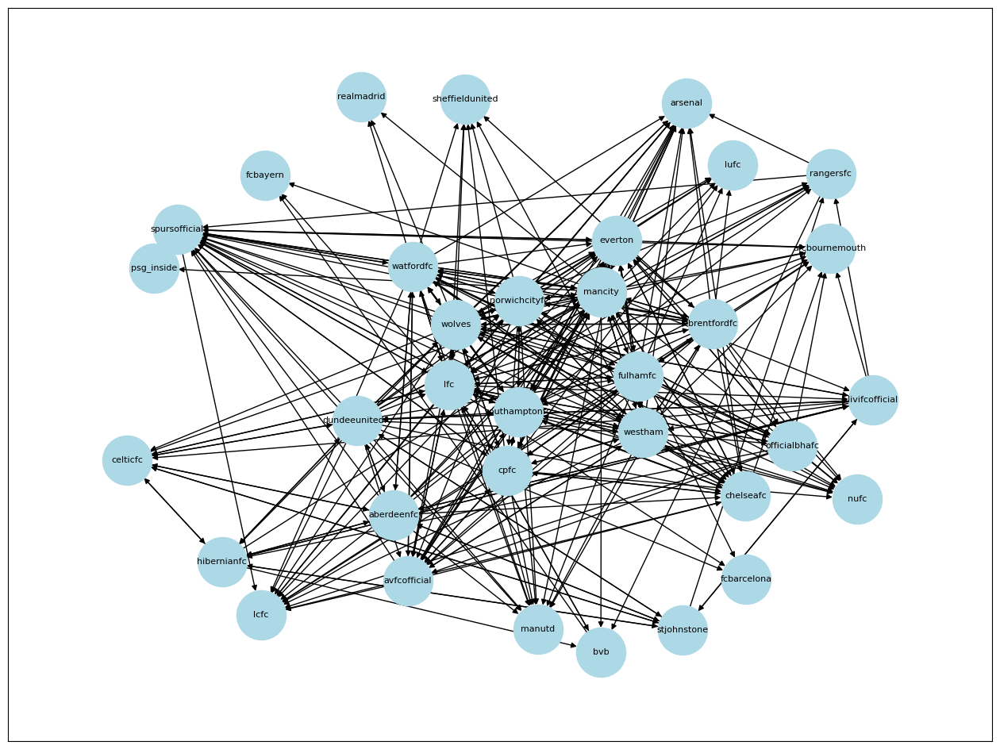

In [5]:
plt.figure(figsize=(16, 12))
plt.margins(0.1, 0.1)
pos = nx.spring_layout(follower_graph, k = 2.2)
nx.draw_networkx(follower_graph, pos, with_labels = True, node_size=2000, font_size=8, node_color="lightblue")

Let's calculate the network's in-degree distrubution

In [6]:
in_deg = pd.Series(dict(follower_graph.in_degree()), name="in-degree")
print("In-Degree Range: [{}, {}]".format(in_deg.min(), in_deg.max()))
print("Mean In-Degree: {}".format(round(in_deg.mean(), 2)))
print("Median In-Degree: {}".format(in_deg.median()))

In-Degree Range: [1, 17]
Mean In-Degree: 9.59
Median In-Degree: 9.0


In [8]:
df1 = in_deg.to_frame()
# display the DataFrame sorted by degree centrality
df1.sort_values(by="in-degree",ascending=False).head(10)

,in-degree
mancity,17
lfc,17
spursofficial,16
lcfc,15
everton,15
arsenal,15
southamptonfc,14
westham,14
chelseafc,14
manutd,13


Let's generate a plot of the in-degree distribution

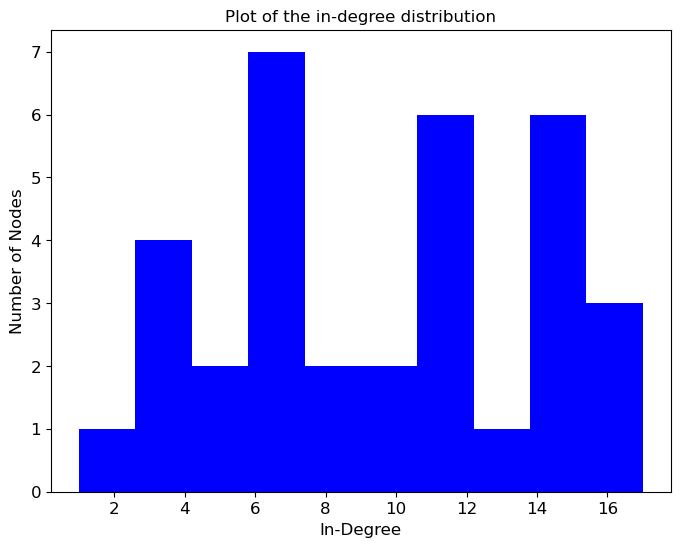

In [9]:
ax1 = in_deg.plot.hist(figsize=(8,6), fontsize=12, legend=None, color="blue")
ax1.set_ylabel("Number of Nodes", fontsize=12)
ax1.set_xlabel("In-Degree", fontsize=12);
plt.title("Plot of the in-degree distribution");

The histogram is multimodal, with the majority of nodes having an in-degree of 6-7, 11-12 or 14-15. 

Let's generate the betweenness centrality distribution too

In [10]:
betw1 = nx.betweenness_centrality(follower_graph)
df1["betweenness"] = pd.Series(betw1)
df1.sort_values(by="betweenness", ascending=False).head(10)

,in-degree,betweenness
lfc,17,0.139358
mancity,17,0.091221
wolves,11,0.040562
dundeeunitedfc,5,0.037638
watfordfc,12,0.030473
livifcofficial,7,0.026637
aberdeenfc,6,0.020444
westham,14,0.017106
celticfc,7,0.015544
everton,15,0.013584


Let's identify some of the influential clubs in this network by ranking them according to their in-degree and betweenness centralities

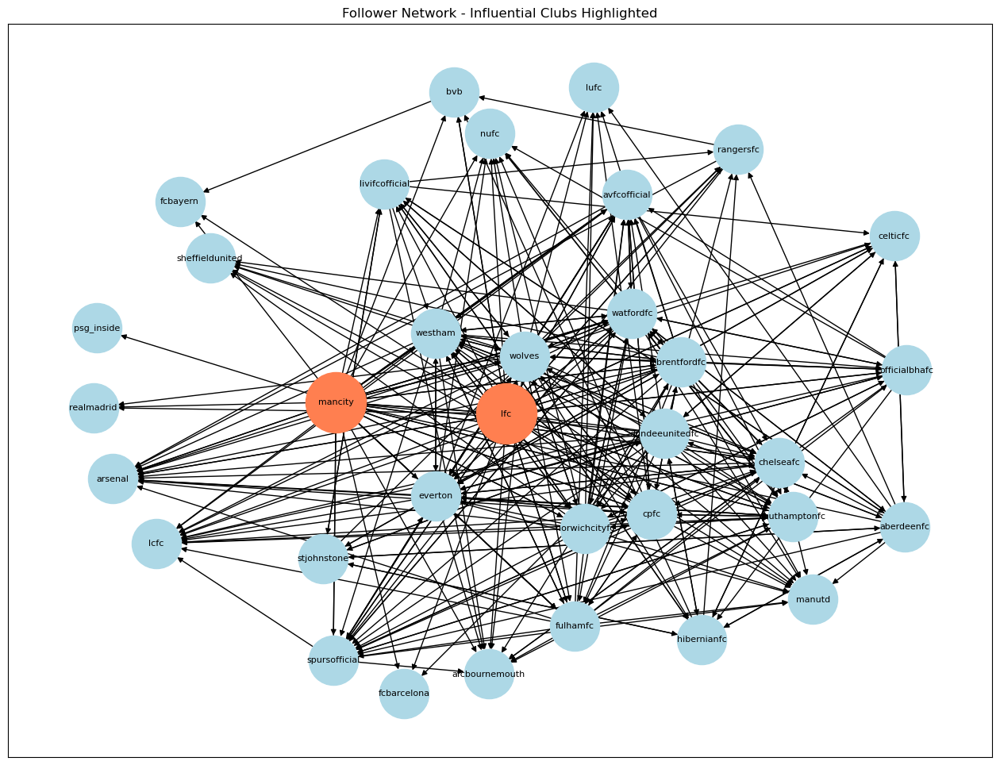

In [11]:
plt.figure(figsize=(16, 12))
influential_clubs = ["mancity", "lfc"]
pos = nx.spring_layout(follower_graph, k=2.2)
nx.draw_networkx(follower_graph, pos, with_labels=True, node_size=2000, node_color="lightblue", font_size=8)
nx.draw_networkx_nodes(follower_graph, pos, nodelist=influential_clubs, node_size=3000, node_color="coral")
plt.title("Follower Network - Influential Clubs Highlighted")
plt.show()

As expected, the most influential clubs are located centrally

In [12]:
print("Reciprocity %.2f" % nx.reciprocity(follower_graph) )

Reciprocity 0.53


On average, clubs follow 53% of clubs that follow them.

Let's construct an undirected version of the follower network, where we only keep reciprocal edges. 

In [13]:
# create the new undirected version of the network
ug1 = follower_graph.to_undirected(reciprocal=True)
ug1.number_of_nodes(), ug1.number_of_edges()

(34, 87)

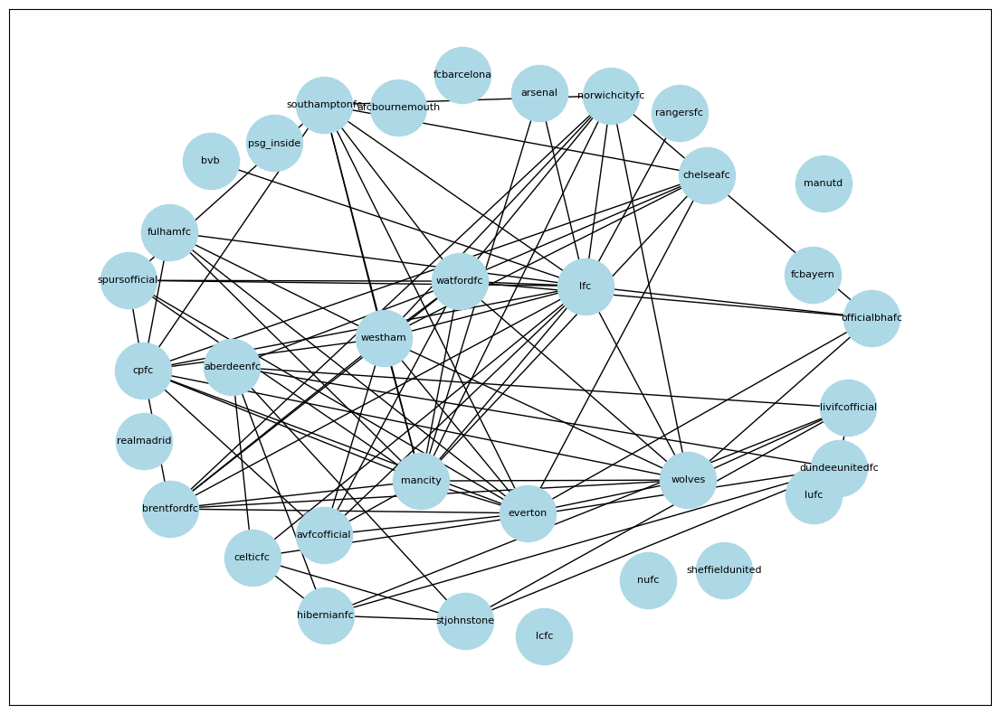

In [14]:
# plot the new network
plt.figure(figsize=(14,10))
plt.margins(0.1, 0.1)
pos = nx.spring_layout(ug1, k = 2.2)
nx.draw_networkx(ug1, pos, with_labels = True, node_size=2000, font_size=8, node_color="lightblue")

We can see that some nodes have become isolated, let's identify and remove these nodes then briefly characterise this network

In [15]:
#identify the isolated nodes
isolated = list(nx.isolates(ug1))
print(isolated)

['sheffieldunited', 'afcbournemouth', 'lcfc', 'manutd', 'nufc', 'realmadrid', 'lufc', 'psg_inside', 'fcbarcelona', 'fcbayern']


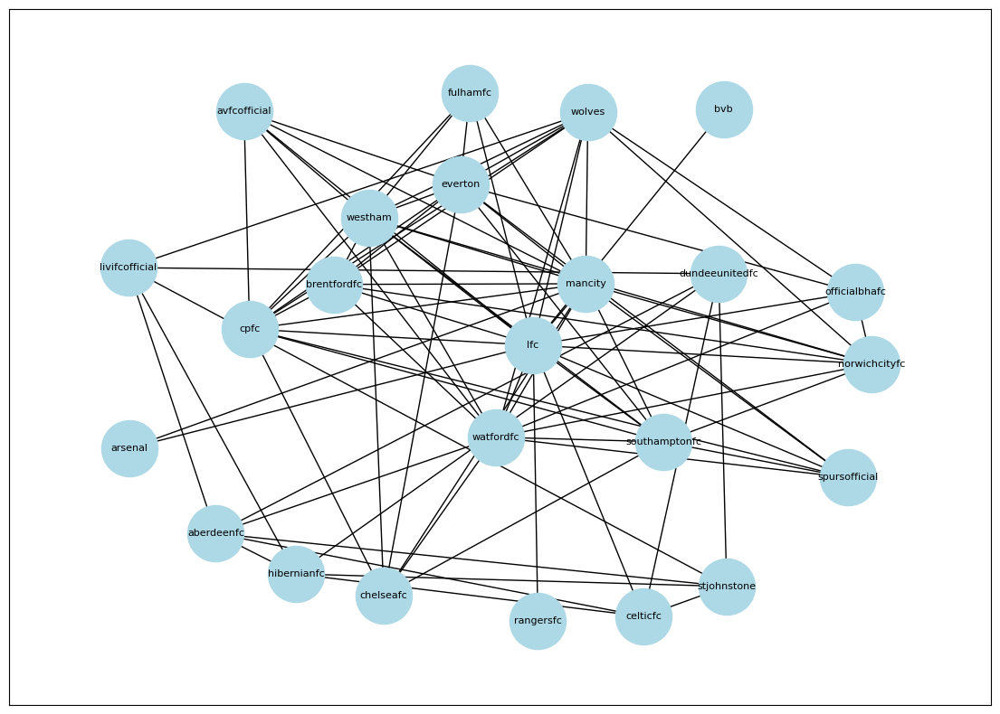

In [16]:
#remove isolates
ug1.remove_nodes_from(isolated)
# plot the new network
plt.figure(figsize=(14,10))
plt.margins(0.1, 0.1)
pos = nx.spring_layout(ug1, k = 2.2)
nx.draw_networkx(ug1, pos, with_labels = True, node_size=2000, font_size=8, node_color="lightblue")

In [17]:
print("Number of nodes: {}".format(ug1.number_of_nodes()))
print("Number of edges: {}".format(ug1.number_of_edges()))
print("Density: {}".format(round(nx.density(ug1), 2)))
print("Diameter: {}".format(nx.diameter(ug1)))
print("Average Clustering Coefficient: {}".format(round(nx.average_clustering(ug1), 3)))

Number of nodes: 24
Number of edges: 87
Density: 0.32
Diameter: 3
Average Clustering Coefficient: 0.65


- There are 24 football clubs and 87 edges in the network. 
- The network is sparse which means that the network isn't well linked. 
- The network is connected as the isolates were removed
- The network's longest shortest path is 3 which means the network is well linked
- The level of clustering accross the entire network is 0.65, the network is relatively well clustered

Let's generate the degree distribution 

In [18]:
deg1 = pd.Series(dict(ug1.degree()), name="Degree")
print("Degree Range: [{}, {}]".format(deg1.min(), deg1.max()))
print("Mean Degree: {}".format(deg1.mean()))
print("Median Degree: {}".format(deg1.median()))

Degree Range: [1, 16]
Mean Degree: 7.25
Median Degree: 6.0


Let's plot this distribution

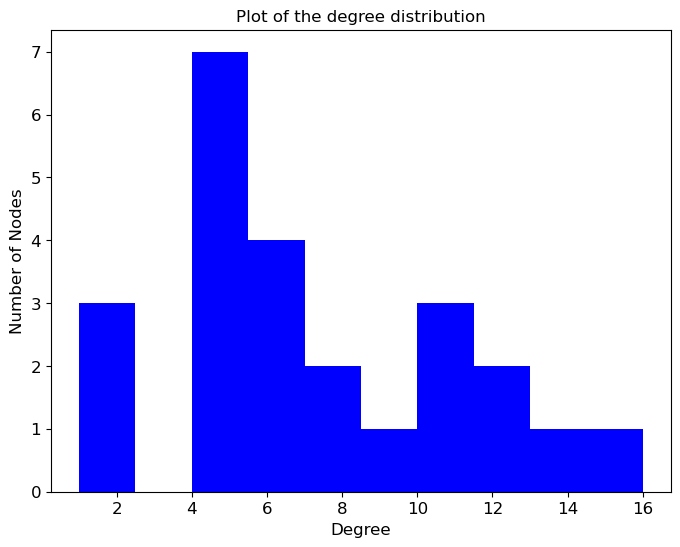

In [19]:
ax1 = deg1.plot.hist(figsize=(8,6), fontsize=12, legend=None, color="blue")
ax1.set_ylabel("Number of Nodes", fontsize=12)
ax1.set_xlabel("Degree", fontsize=12);
plt.title("Plot of the degree distribution");

The histogram is skewed to the left, with the majority of nodes having a degree of less than 8.

Let's identify some of the important nodes.

In [20]:
df2 = deg1.to_frame()
# display the DataFrame sorted by degree centrality
df2.sort_values(by="Degree",ascending=False).head(10)

,Degree
lfc,16
mancity,14
watfordfc,12
westham,12
cpfc,11
everton,11
wolves,10
southamptonfc,9
norwichcityfc,8
brentfordfc,8


In [21]:
betw2 = nx.betweenness_centrality(ug1)
df2["betweenness"] = pd.Series(betw2)
df2.sort_values(by="betweenness", ascending=False).head(10)

,Degree,betweenness
lfc,16,0.352621
watfordfc,12,0.133951
celticfc,5,0.111361
wolves,10,0.109366
aberdeenfc,6,0.069241
mancity,14,0.062714
livifcofficial,5,0.052138
everton,11,0.028868
westham,12,0.025297
cpfc,11,0.022214


This time, Man City isn't even in the top 10 betweenness scores. Liverpool acts as a broker and influencer in this network. Ley's highlight their node.

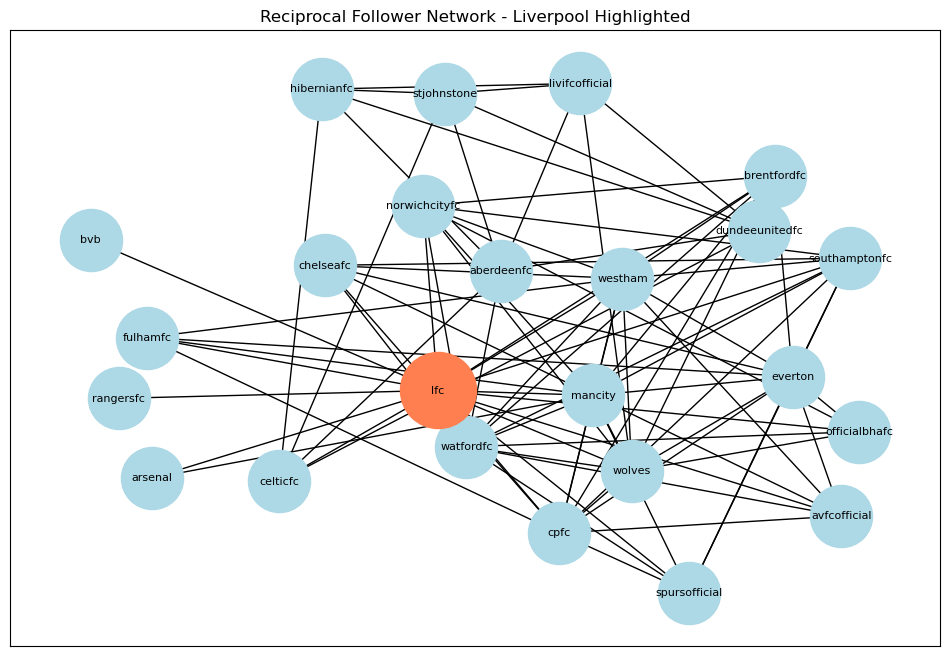

In [22]:
plt.figure(figsize=(12, 8))
influential_clubs = ["lfc"]
pos = nx.spring_layout(ug1, k=2.2)
nx.draw_networkx(ug1, pos, with_labels=True, node_size=2000, node_color="lightblue", font_size=8)
nx.draw_networkx_nodes(ug1, pos, nodelist=influential_clubs, node_size=3000, node_color="coral")
plt.title("Reciprocal Follower Network - Liverpool Highlighted")
plt.show()

We can again see that Liverpool is located quite centrally in the network.

## Task 3: Mention Network

Let's mine the data and create user and tweet dataframes

In [23]:
# read in the JSONL text
users_data = []
fin = open("data/list_members.jsonl","r")
# process each line as a separate JSON document
for line in fin.readlines():
    user = json.loads( line )
    users_data.append( user )
fin.close()
print("Read %d user profiles" % len(users_data))

Read 34 user profiles


In [24]:
fin = open("data/tweets.jsonl", "r")
tweets_data = []
# process the file line-by-line
for line in fin.readlines():
    line = line.strip()
    # each line contains a JSON document, representing a single tweet
    tweet = json.loads(line)
    tweets_data.append(tweet)
fin.close()
print("Read %d tweets" % len(tweets_data))

Read 28350 tweets


In [25]:
tweets = pd.DataFrame(tweets_data).set_index("id")
tweets.head()

,created_at,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,...,favorite_count,favorited,retweeted,possibly_sensitive,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status_permalink,quoted_status
id,,,,,,,,,,,,,,,,,,,,,
1586781492130226179,Sun Oct 30 18:06:03 +0000 2022,1586781492130226179,Defeat in Manchester. https://t.co/nQbMXGgtXe,False,"[0, 21]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 1586781146574094337, 'id_str...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,2209,False,False,False,en,NaN,NaN,NaN,NaN,NaN
1571137260569120773,Sat Sep 17 14:01:27 +0000 2022,1571137260569120773,Underway in Newcastle... \n\nUTC 👊👊 \n\n1' | ⚫...,False,"[0, 60]","{'hashtags': [{'text': 'NEWBOU', 'indices': [5...",NaN,"<a href=""https://twitter.com"" rel=""nofollow"">T...",NaN,None,...,63,False,False,NaN,en,NaN,NaN,NaN,NaN,NaN
1581025775783800832,Fri Oct 14 20:54:53 +0000 2022,1581025775783800832,FT: All over at Brentford.\n\n[2-0] 📲 https://...,False,"[0, 71]","{'hashtags': [{'text': 'BHAFC', 'indices': [63...","{'media': [{'id': 1581025629792878592, 'id_str...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,591,False,False,False,en,NaN,NaN,NaN,NaN,NaN
1586379866680676352,Sat Oct 29 15:30:08 +0000 2022,1586379866680676352,"72': Standing ovation for Kaoru, who comes off...",False,"[0, 107]","{'hashtags': [{'text': 'BHAFC', 'indices': [97...","{'media': [{'id': 1586379799886438403, 'id_str...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,None,...,544,False,False,False,en,NaN,NaN,NaN,NaN,NaN
1591026092764168192,Fri Nov 11 11:12:35 +0000 2022,1591026092764168192,🔴 JETZT LIVE: Die Pressekonferenz mit @J__Nag...,False,"[0, 124]","{'hashtags': [{'text': 'S04FCB', 'indices': [1...",NaN,"<a href=""https://twitter.com"" rel=""nofollow"">T...",NaN,None,...,300,False,False,NaN,de,NaN,NaN,NaN,NaN,NaN


In [26]:
#list columns and identify useless ones
tweets.columns

Index(['created_at', 'id_str', 'full_text', 'truncated', 'display_text_range',
       'entities', 'extended_entities', 'source', 'in_reply_to_status_id',
       'in_reply_to_status_id_str', 'in_reply_to_user_id',
       'in_reply_to_user_id_str', 'in_reply_to_screen_name', 'user', 'geo',
       'coordinates', 'place', 'contributors', 'is_quote_status',
       'retweet_count', 'favorite_count', 'favorited', 'retweeted',
       'possibly_sensitive', 'lang', 'retweeted_status', 'quoted_status_id',
       'quoted_status_id_str', 'quoted_status_permalink', 'quoted_status'],
      dtype='object')

In [27]:
tweets = tweets.drop( ['possibly_sensitive',
        'display_text_range',
        'truncated',
        'contributors',
        'coordinates', 
        'extended_entities',
        'id_str',
        'in_reply_to_user_id', 'in_reply_to_user_id_str', 'is_quote_status', 
        'quoted_status_id', 'quoted_status_id_str', 'quoted_status_permalink', 'quoted_status',
        'source'], axis=1 )

In [28]:
tweets.head()

,created_at,full_text,entities,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_screen_name,user,geo,place,retweet_count,favorite_count,favorited,retweeted,lang,retweeted_status
id,,,,,,,,,,,,,,,
1586781492130226179,Sun Oct 30 18:06:03 +0000 2022,Defeat in Manchester. https://t.co/nQbMXGgtXe,"{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,None,None,"{'id': 156247074, 'id_str': '156247074', 'name...",None,None,106,2209,False,False,en,NaN
1571137260569120773,Sat Sep 17 14:01:27 +0000 2022,Underway in Newcastle... \n\nUTC 👊👊 \n\n1' | ⚫...,"{'hashtags': [{'text': 'NEWBOU', 'indices': [5...",NaN,None,None,"{'id': 20880206, 'id_str': '20880206', 'name':...",None,None,3,63,False,False,en,NaN
1581025775783800832,Fri Oct 14 20:54:53 +0000 2022,FT: All over at Brentford.\n\n[2-0] 📲 https://...,"{'hashtags': [{'text': 'BHAFC', 'indices': [63...",NaN,None,None,"{'id': 57606154, 'id_str': '57606154', 'name':...",None,None,53,591,False,False,en,NaN
1586379866680676352,Sat Oct 29 15:30:08 +0000 2022,"72': Standing ovation for Kaoru, who comes off...","{'hashtags': [{'text': 'BHAFC', 'indices': [97...",NaN,None,None,"{'id': 57606154, 'id_str': '57606154', 'name':...",None,None,47,544,False,False,en,NaN
1591026092764168192,Fri Nov 11 11:12:35 +0000 2022,🔴 JETZT LIVE: Die Pressekonferenz mit @J__Nag...,"{'hashtags': [{'text': 'S04FCB', 'indices': [1...",NaN,None,None,"{'id': 773069256, 'id_str': '773069256', 'name...",None,None,10,300,False,False,de,NaN


In [29]:
tweets["entities"][1586781492130226179]

{'hashtags': [],
 'symbols': [],
 'user_mentions': [],
 'urls': [],
 'media': [{'id': 1586781146574094337,
   'id_str': '1586781146574094337',
   'indices': [22, 45],
   'media_url': 'http://pbs.twimg.com/media/FgVhC7HWAAExDuw.jpg',
   'media_url_https': 'https://pbs.twimg.com/media/FgVhC7HWAAExDuw.jpg',
   'url': 'https://t.co/nQbMXGgtXe',
   'display_url': 'pic.twitter.com/nQbMXGgtXe',
   'expanded_url': 'https://twitter.com/WestHam/status/1586781492130226179/photo/1',
   'type': 'photo',
   'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'},
    'medium': {'w': 960, 'h': 1200, 'resize': 'fit'},
    'large': {'w': 1638, 'h': 2048, 'resize': 'fit'},
    'small': {'w': 544, 'h': 680, 'resize': 'fit'}}}]}

In [30]:
tweets["hashtags"] = tweets["entities"].apply(lambda x: x["hashtags"])
tweets.head()

,created_at,full_text,entities,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_screen_name,user,geo,place,retweet_count,favorite_count,favorited,retweeted,lang,retweeted_status,hashtags
id,,,,,,,,,,,,,,,,
1586781492130226179,Sun Oct 30 18:06:03 +0000 2022,Defeat in Manchester. https://t.co/nQbMXGgtXe,"{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,None,None,"{'id': 156247074, 'id_str': '156247074', 'name...",None,None,106,2209,False,False,en,NaN,[]
1571137260569120773,Sat Sep 17 14:01:27 +0000 2022,Underway in Newcastle... \n\nUTC 👊👊 \n\n1' | ⚫...,"{'hashtags': [{'text': 'NEWBOU', 'indices': [5...",NaN,None,None,"{'id': 20880206, 'id_str': '20880206', 'name':...",None,None,3,63,False,False,en,NaN,"[{'text': 'NEWBOU', 'indices': [53, 60]}]"
1581025775783800832,Fri Oct 14 20:54:53 +0000 2022,FT: All over at Brentford.\n\n[2-0] 📲 https://...,"{'hashtags': [{'text': 'BHAFC', 'indices': [63...",NaN,None,None,"{'id': 57606154, 'id_str': '57606154', 'name':...",None,None,53,591,False,False,en,NaN,"[{'text': 'BHAFC', 'indices': [63, 69]}]"
1586379866680676352,Sat Oct 29 15:30:08 +0000 2022,"72': Standing ovation for Kaoru, who comes off...","{'hashtags': [{'text': 'BHAFC', 'indices': [97...",NaN,None,None,"{'id': 57606154, 'id_str': '57606154', 'name':...",None,None,47,544,False,False,en,NaN,"[{'text': 'BHAFC', 'indices': [97, 103]}]"
1591026092764168192,Fri Nov 11 11:12:35 +0000 2022,🔴 JETZT LIVE: Die Pressekonferenz mit @J__Nag...,"{'hashtags': [{'text': 'S04FCB', 'indices': [1...",NaN,None,None,"{'id': 773069256, 'id_str': '773069256', 'name...",None,None,10,300,False,False,de,NaN,"[{'text': 'S04FCB', 'indices': [108, 115]}, {'..."


In [31]:
tweets["hashtags"][1591026092764168192]

[{'text': 'S04FCB', 'indices': [108, 115]},
 {'text': 'packmas', 'indices': [116, 124]}]

In [32]:
tweets["user_mentions"] = tweets["entities"].apply(lambda x: x["user_mentions"])
tweets.head()

,created_at,full_text,entities,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_screen_name,user,geo,place,retweet_count,favorite_count,favorited,retweeted,lang,retweeted_status,hashtags,user_mentions
id,,,,,,,,,,,,,,,,,
1586781492130226179,Sun Oct 30 18:06:03 +0000 2022,Defeat in Manchester. https://t.co/nQbMXGgtXe,"{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,None,None,"{'id': 156247074, 'id_str': '156247074', 'name...",None,None,106,2209,False,False,en,NaN,[],[]
1571137260569120773,Sat Sep 17 14:01:27 +0000 2022,Underway in Newcastle... \n\nUTC 👊👊 \n\n1' | ⚫...,"{'hashtags': [{'text': 'NEWBOU', 'indices': [5...",NaN,None,None,"{'id': 20880206, 'id_str': '20880206', 'name':...",None,None,3,63,False,False,en,NaN,"[{'text': 'NEWBOU', 'indices': [53, 60]}]",[]
1581025775783800832,Fri Oct 14 20:54:53 +0000 2022,FT: All over at Brentford.\n\n[2-0] 📲 https://...,"{'hashtags': [{'text': 'BHAFC', 'indices': [63...",NaN,None,None,"{'id': 57606154, 'id_str': '57606154', 'name':...",None,None,53,591,False,False,en,NaN,"[{'text': 'BHAFC', 'indices': [63, 69]}]",[]
1586379866680676352,Sat Oct 29 15:30:08 +0000 2022,"72': Standing ovation for Kaoru, who comes off...","{'hashtags': [{'text': 'BHAFC', 'indices': [97...",NaN,None,None,"{'id': 57606154, 'id_str': '57606154', 'name':...",None,None,47,544,False,False,en,NaN,"[{'text': 'BHAFC', 'indices': [97, 103]}]",[]
1591026092764168192,Fri Nov 11 11:12:35 +0000 2022,🔴 JETZT LIVE: Die Pressekonferenz mit @J__Nag...,"{'hashtags': [{'text': 'S04FCB', 'indices': [1...",NaN,None,None,"{'id': 773069256, 'id_str': '773069256', 'name...",None,None,10,300,False,False,de,NaN,"[{'text': 'S04FCB', 'indices': [108, 115]}, {'...","[{'screen_name': 'J__Nagelsmann', 'name': 'Jul..."


In [33]:
tweets["user_mentions"][1591026092764168192]

[{'screen_name': 'J__Nagelsmann',
  'name': 'Julian Nagelsmann',
  'id': 1365348613304557575,
  'id_str': '1365348613304557575',
  'indices': [39, 53]},
 {'screen_name': 's04',
  'name': 'FC Schalke 04',
  'id': 296163037,
  'id_str': '296163037',
  'indices': [99, 103]}]

In [34]:
tweets["user"][1591026092764168192]

{'id': 773069256,
 'id_str': '773069256',
 'name': 'FC Bayern München',
 'screen_name': 'FCBayern',
 'location': 'Säbener Straße, München',
 'description': '#FCBayern 🗺 @FCBayernEN 🇬🇧 @FCBayernES 🇪🇸 @FCBayernUS 🇺🇸 @FCBayernBR 🇧🇷 @FCBayernAr AR Fans: @FCBayern_FB Jugend: @FCBayernCampus Frauen: @FCBfrauen',
 'url': 'https://t.co/P4MezQCXfX',
 'entities': {'url': {'urls': [{'url': 'https://t.co/P4MezQCXfX',
     'expanded_url': 'https://linktr.ee/fcbayern',
     'display_url': 'linktr.ee/fcbayern',
     'indices': [0, 23]}]},
  'description': {'urls': []}},
 'protected': False,
 'followers_count': 6577534,
 'friends_count': 43,
 'listed_count': 8110,
 'created_at': 'Wed Aug 22 07:10:46 +0000 2012',
 'favourites_count': 10845,
 'utc_offset': None,
 'time_zone': None,
 'geo_enabled': True,
 'verified': True,
 'statuses_count': 81895,
 'lang': None,
 'contributors_enabled': False,
 'is_translator': False,
 'is_translation_enabled': True,
 'profile_background_color': '080808',
 'profile_back

In [35]:
tweets["user_id"] = tweets["user"].apply(lambda x: x["id"])
tweets["user_screen_name"] = tweets["user"].apply(lambda x: x["screen_name"])
tweets.head()

,created_at,full_text,entities,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_screen_name,user,geo,place,retweet_count,favorite_count,favorited,retweeted,lang,retweeted_status,hashtags,user_mentions,user_id,user_screen_name
id,,,,,,,,,,,,,,,,,,,
1586781492130226179,Sun Oct 30 18:06:03 +0000 2022,Defeat in Manchester. https://t.co/nQbMXGgtXe,"{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,None,None,"{'id': 156247074, 'id_str': '156247074', 'name...",None,None,106,2209,False,False,en,NaN,[],[],156247074,WestHam
1571137260569120773,Sat Sep 17 14:01:27 +0000 2022,Underway in Newcastle... \n\nUTC 👊👊 \n\n1' | ⚫...,"{'hashtags': [{'text': 'NEWBOU', 'indices': [5...",NaN,None,None,"{'id': 20880206, 'id_str': '20880206', 'name':...",None,None,3,63,False,False,en,NaN,"[{'text': 'NEWBOU', 'indices': [53, 60]}]",[],20880206,afcbournemouth
1581025775783800832,Fri Oct 14 20:54:53 +0000 2022,FT: All over at Brentford.\n\n[2-0] 📲 https://...,"{'hashtags': [{'text': 'BHAFC', 'indices': [63...",NaN,None,None,"{'id': 57606154, 'id_str': '57606154', 'name':...",None,None,53,591,False,False,en,NaN,"[{'text': 'BHAFC', 'indices': [63, 69]}]",[],57606154,OfficialBHAFC
1586379866680676352,Sat Oct 29 15:30:08 +0000 2022,"72': Standing ovation for Kaoru, who comes off...","{'hashtags': [{'text': 'BHAFC', 'indices': [97...",NaN,None,None,"{'id': 57606154, 'id_str': '57606154', 'name':...",None,None,47,544,False,False,en,NaN,"[{'text': 'BHAFC', 'indices': [97, 103]}]",[],57606154,OfficialBHAFC
1591026092764168192,Fri Nov 11 11:12:35 +0000 2022,🔴 JETZT LIVE: Die Pressekonferenz mit @J__Nag...,"{'hashtags': [{'text': 'S04FCB', 'indices': [1...",NaN,None,None,"{'id': 773069256, 'id_str': '773069256', 'name...",None,None,10,300,False,False,de,NaN,"[{'text': 'S04FCB', 'indices': [108, 115]}, {'...","[{'screen_name': 'J__Nagelsmann', 'name': 'Jul...",773069256,FCBayern


Hashtags and user mentions store lists of dictionaries containing the information we need and unnneccessary information. Let's extract the useful data and store it in a list. Let's make 2 helper functions

In [36]:
def convert_hashtags(hashlist):
    hashtags = []
    for d in hashlist:
        hashtags.append(d["text"])
    return hashtags

def convert_mentions(mentions_list):
    mentions = []
    for d in mentions_list:
        mentions.append(d["screen_name"])
    return mentions

In [37]:
tweets["user mentions"] = tweets["user_mentions"].apply(convert_mentions)
tweets["used hashtags"] = tweets["hashtags"].apply(convert_hashtags)

In [38]:
tweets.head()

,created_at,full_text,entities,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_screen_name,user,geo,place,retweet_count,...,favorited,retweeted,lang,retweeted_status,hashtags,user_mentions,user_id,user_screen_name,user mentions,used hashtags
id,,,,,,,,,,,,,,,,,,,,,
1586781492130226179,Sun Oct 30 18:06:03 +0000 2022,Defeat in Manchester. https://t.co/nQbMXGgtXe,"{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,None,None,"{'id': 156247074, 'id_str': '156247074', 'name...",None,None,106,...,False,False,en,NaN,[],[],156247074,WestHam,[],[]
1571137260569120773,Sat Sep 17 14:01:27 +0000 2022,Underway in Newcastle... \n\nUTC 👊👊 \n\n1' | ⚫...,"{'hashtags': [{'text': 'NEWBOU', 'indices': [5...",NaN,None,None,"{'id': 20880206, 'id_str': '20880206', 'name':...",None,None,3,...,False,False,en,NaN,"[{'text': 'NEWBOU', 'indices': [53, 60]}]",[],20880206,afcbournemouth,[],[NEWBOU]
1581025775783800832,Fri Oct 14 20:54:53 +0000 2022,FT: All over at Brentford.\n\n[2-0] 📲 https://...,"{'hashtags': [{'text': 'BHAFC', 'indices': [63...",NaN,None,None,"{'id': 57606154, 'id_str': '57606154', 'name':...",None,None,53,...,False,False,en,NaN,"[{'text': 'BHAFC', 'indices': [63, 69]}]",[],57606154,OfficialBHAFC,[],[BHAFC]
1586379866680676352,Sat Oct 29 15:30:08 +0000 2022,"72': Standing ovation for Kaoru, who comes off...","{'hashtags': [{'text': 'BHAFC', 'indices': [97...",NaN,None,None,"{'id': 57606154, 'id_str': '57606154', 'name':...",None,None,47,...,False,False,en,NaN,"[{'text': 'BHAFC', 'indices': [97, 103]}]",[],57606154,OfficialBHAFC,[],[BHAFC]
1591026092764168192,Fri Nov 11 11:12:35 +0000 2022,🔴 JETZT LIVE: Die Pressekonferenz mit @J__Nag...,"{'hashtags': [{'text': 'S04FCB', 'indices': [1...",NaN,None,None,"{'id': 773069256, 'id_str': '773069256', 'name...",None,None,10,...,False,False,de,NaN,"[{'text': 'S04FCB', 'indices': [108, 115]}, {'...","[{'screen_name': 'J__Nagelsmann', 'name': 'Jul...",773069256,FCBayern,"[J__Nagelsmann, s04]","[S04FCB, packmas]"


Now we have the necessary data to create a mention network

### Construction

I am going to create a directed weighted network. Edges will be added when a club mentions another club.

How:
- iterrate over each unique club. 
- iterrate over each tweet tweeted by the club 
- iterrate over each mentioned user in the tweet
- if the mentioned user is valid (a football club and not the club itself), add a new edge or increment the weight of the existing edge between the club and mentioned club

In [39]:
mention_graph = nx.DiGraph()
for user in tweets["user_screen_name"].unique():
    df = tweets[tweets["user_screen_name"] == user]
    for i, row in df.iterrows():
        for mentioned_user in row["user mentions"]:
            if mentioned_user not in tweets["user_screen_name"].unique() or mentioned_user == user:
                continue
            if mention_graph.has_edge(user, mentioned_user):
                mention_graph[user][mentioned_user]["weight"] += 1
            else:
                mention_graph.add_edge(user, mentioned_user, weight=1)

In [40]:
print("Number of nodes: {}".format(mention_graph.number_of_nodes()))
print("Number of edges: {}".format(mention_graph.number_of_edges()))
print("Density: {}".format(round(nx.density(mention_graph), 2)))
print("Is the network strongly connected?: {}".format(nx.is_strongly_connected(mention_graph)))
print("Average Clustering Coefficient: {}".format(round(nx.average_clustering(mention_graph), 3)))

Number of nodes: 34
Number of edges: 138
Density: 0.12
Is the network strongly connected?: False
Average Clustering Coefficient: 0.269


- There are 34 football clubs and 138 edges in the network. 
- The network is sparse which means that the network isn't well linked. 
- The network is not strongly connected as not every node is reachable from every other node
- The level of clustering accross the entire network is 0.269, the network is not well clustered

Let's draw the network

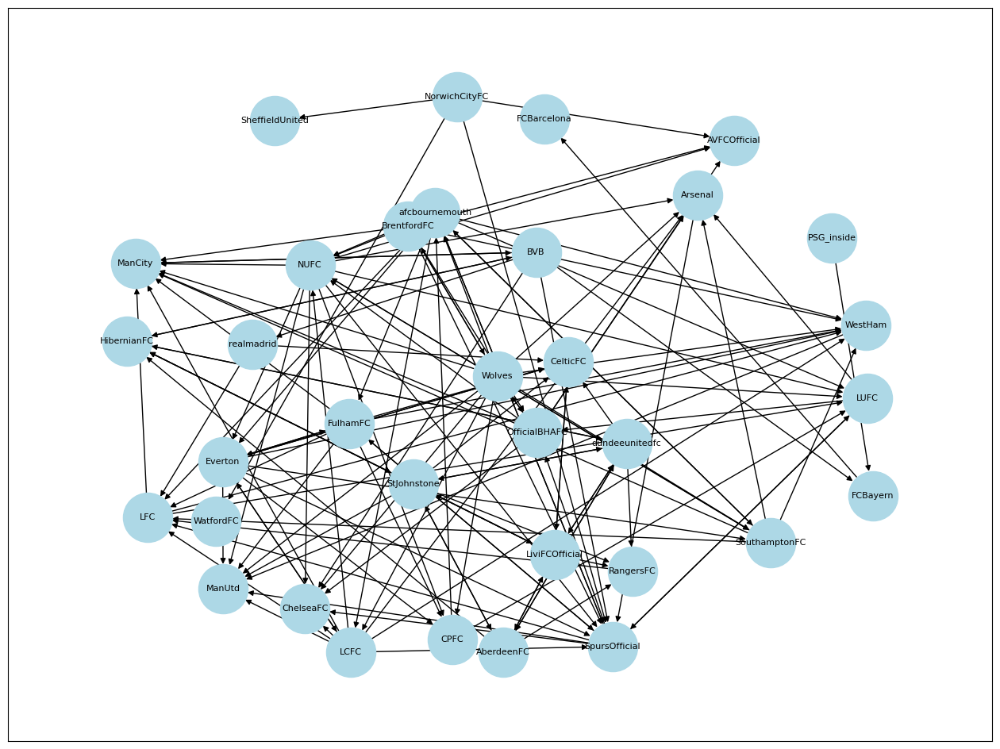

In [119]:
plt.figure(figsize=(16, 12))
plt.margins(0.1, 0.1)
pos = nx.spring_layout(mention_graph, k = 2.2)
nx.draw_networkx(mention_graph, pos, with_labels = True, node_size=2000, font_size=8, node_color="lightblue")

In [42]:
print("Reciprocity %.2f" % nx.reciprocity(mention_graph))

Reciprocity 0.30


The level of reciprocity is quite low. My educated guess is that this occurs when clubs congratulate other clubs when they win competitions. The mention is not reciprocated as there can only be one winner per competition.  

This is another directed network, however this time it is weighted. Let's calculate and plot the weighted in-degree and weighted out-degree distributions

In [43]:
in_deg2 = pd.Series(dict(mention_graph.in_degree(weight="weight")), name="w-in-degree")
pd.DataFrame(in_deg2).sort_values(by="w-in-degree", ascending=False).head(10)

,w-in-degree
CelticFC,43
HibernianFC,41
AberdeenFC,34
RangersFC,31
LiviFCOfficial,24
dundeeunitedfc,23
LFC,20
ManCity,16
ChelseaFC,15
ManUtd,15


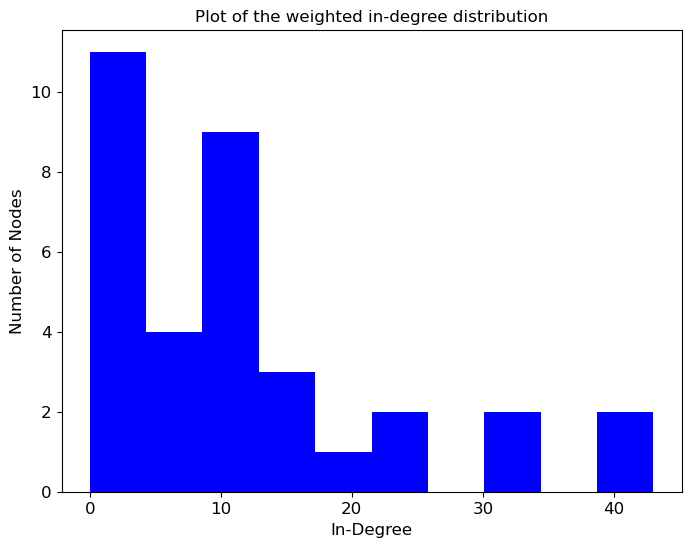

In [44]:
ax1 = in_deg2.plot.hist(figsize=(8,6), fontsize=12, legend=None, color="blue")
ax1.set_ylabel("Number of Nodes", fontsize=12)
ax1.set_xlabel("In-Degree", fontsize=12);
plt.title("Plot of the weighted in-degree distribution");

This distribution is heavily skewed to the left. Most clubs have a weighted in-degree of less than 15. 

In [45]:
wout_degrees = pd.Series(dict(mention_graph.out_degree(weight="weight")), name="w-out-degree")
pd.DataFrame(wout_degrees).sort_values(by="w-out-degree", ascending=False).head(10)

,w-out-degree
StJohnstone,110
Wolves,44
LiviFCOfficial,39
dundeeunitedfc,20
FulhamFC,19
BrentfordFC,18
realmadrid,15
SpursOfficial,14
AberdeenFC,14
NUFC,12


In [46]:
100.0 * (wout_degrees["StJohnstone"]/wout_degrees.sum())

27.431421446384043

St Johnstone account for 27% of user mentions ! This can be seen clearly in the histogram below

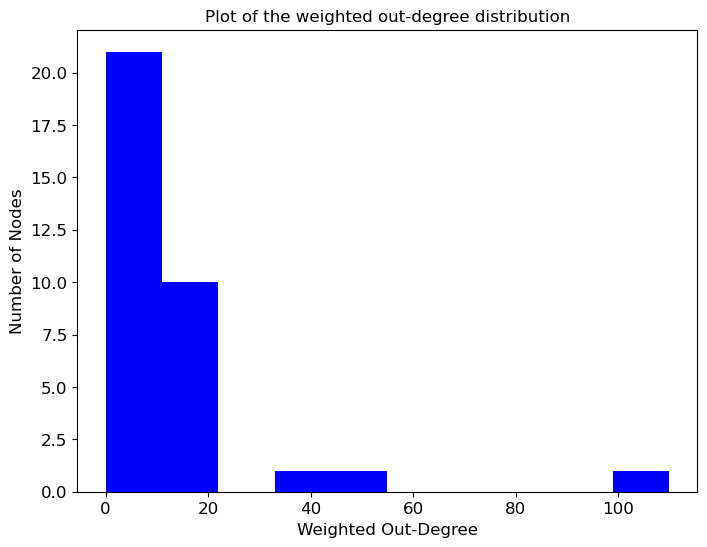

In [47]:
ax1 = wout_degrees.plot.hist(figsize=(8,6), fontsize=12, legend=None, color="blue")
ax1.set_ylabel("Number of Nodes", fontsize=12)
ax1.set_xlabel("Weighted Out-Degree", fontsize=12);
plt.title("Plot of the weighted out-degree distribution");

This distribution is heavily skewed to the left. Most clubs have a weighted out-degree of less than 20.

Let's have a look at some other centrality measures to find influential nodes

In [48]:
df3 = in_deg2.to_frame()
df3["weighted_outdegree"] = wout_degrees
wbet1 = nx.betweenness_centrality(mention_graph, weight="weight")
df3["weighted_betweenness"] = pd.Series(wbet1)
df3.sort_values(by="weighted_betweenness", ascending=False).head(10)

,w-in-degree,weighted_outdegree,weighted_betweenness
BVB,2,12,0.285541
SpursOfficial,11,14,0.222240
HibernianFC,41,5,0.190623
afcbournemouth,5,12,0.187198
ManCity,16,1,0.156234
LiviFCOfficial,24,39,0.091822
dundeeunitedfc,23,20,0.072443
OfficialBHAFC,11,7,0.063034
LFC,20,4,0.061364
FulhamFC,4,19,0.052040


In [49]:
w_eigs = dict(nx.eigenvector_centrality(mention_graph, weight="weight"))
df3["weighted_eigenvector"] = pd.Series(w_eigs)
df3.sort_values(by="weighted_eigenvector", ascending=False).head(10)

,w-in-degree,weighted_outdegree,weighted_betweenness,weighted_eigenvector
HibernianFC,41,5,0.190623,0.501746
AberdeenFC,34,14,0.000000,0.436088
CelticFC,43,9,0.036616,0.388121
RangersFC,31,7,0.000000,0.377198
dundeeunitedfc,23,20,0.072443,0.311287
LiviFCOfficial,24,39,0.091822,0.300685
StJohnstone,9,110,0.004735,0.182673
Everton,12,11,0.020184,0.144780
LFC,20,4,0.061364,0.144100
BVB,2,12,0.285541,0.027244


Hibernian FC are placed in the top 3 of 3 of the 4 centrality measures. Let's highlight their node and construct their ego network

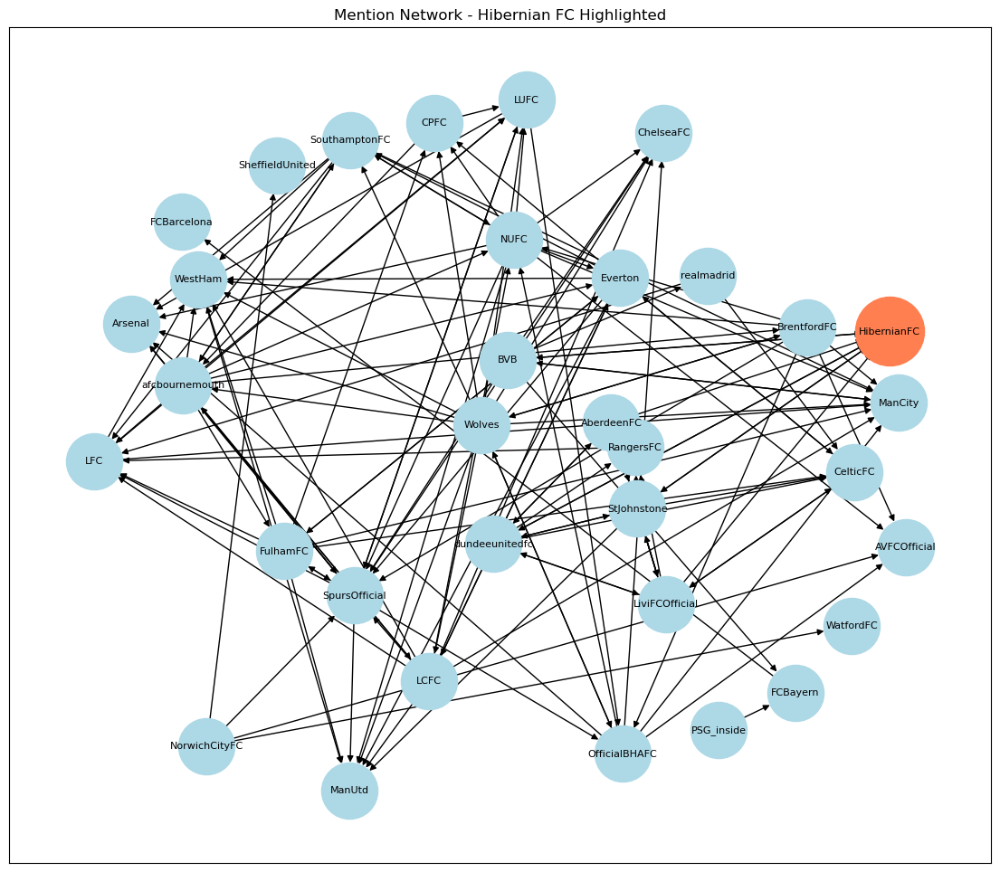

In [50]:
plt.figure(figsize=(14, 12))
influential_clubs = ["HibernianFC"]
pos = nx.spring_layout(mention_graph, k=2.2)
nx.draw_networkx(mention_graph, pos, with_labels=True, node_size=2000, node_color="lightblue", font_size=8)
nx.draw_networkx_nodes(mention_graph, pos, nodelist=influential_clubs, node_size=3000, node_color="coral")
plt.title("Mention Network - Hibernian FC Highlighted")
plt.show()

In [51]:
ego_node = "HibernianFC"
ego1 = nx.ego_graph(mention_graph, ego_node)
ego1.number_of_nodes(), ego1.number_of_edges()

(4, 8)

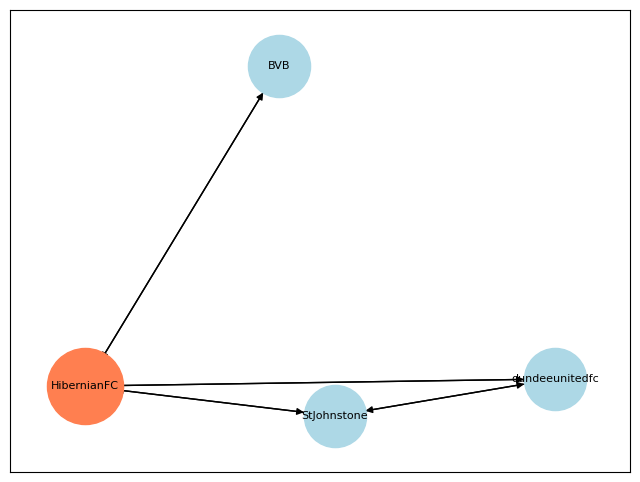

In [52]:
plt.figure(figsize=(8, 6))
plt.margins(0.1, 0.1)
pos = nx.spring_layout(ego1, k=2.2)
nx.draw_networkx(ego1, pos, with_labels = True, node_size=2000, font_size=8, node_color="lightblue")
# add the ego node in a different colour
nx.draw_networkx_nodes(ego1, pos, nodelist=[ego_node], node_size=3000, node_color="coral");

Hibernian FC's ego network is small as their weighted out-degree is low. Let's construct the ego network of the club with the greatest weighted out-degree: St Johnstone

In [53]:
ego_node2 = "StJohnstone"
ego2 = nx.ego_graph(mention_graph, ego_node2)
ego2.number_of_nodes(), ego2.number_of_edges()

(8, 27)

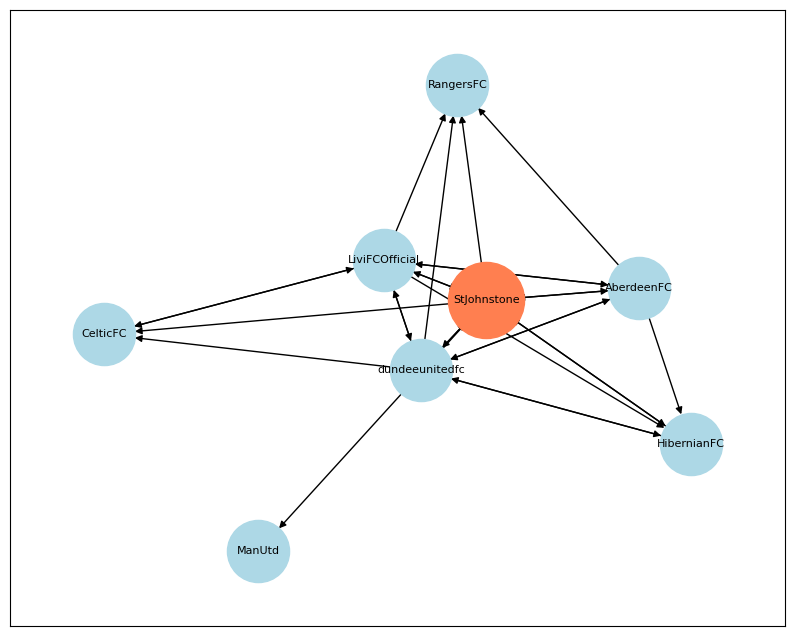

In [54]:
plt.figure(figsize=(10, 8))
plt.margins(0.1, 0.1)
pos = nx.spring_layout(ego2, k=2.2)
nx.draw_networkx(ego2, pos, with_labels = True, node_size=2000, font_size=8, node_color="lightblue")
# add the ego node in a different colour
nx.draw_networkx_nodes(ego2, pos, nodelist=[ego_node2], node_size=3000, node_color="coral");

## Task 2: Reply Network

### Construction

I am going to create a directed weighted network. Edges will be added when a club replies to another club.

How:
- iterrate over each unique club. 
- iterrate over each tweet tweeted by the club 
- if the tweet is a reply to another football club and not itself, add a new edge or increment the weight of the existing edge between the club and the club replied to

In [57]:
reply_graph = nx.DiGraph()
for user in tweets["user_screen_name"].unique():
    df = tweets[tweets["user_screen_name"] == user]
    for i, row in df.iterrows():
        replied_to = row["in_reply_to_screen_name"]
        if replied_to and replied_to in tweets["user_screen_name"].unique() and replied_to != user:
            if reply_graph.has_edge(user, replied_to):
                reply_graph[user][replied_to]["weight"] += 1
            else:
                reply_graph.add_edge(user, replied_to, weight=1)

In [58]:
print("Number of nodes: {}".format(reply_graph.number_of_nodes()))
print("Number of edges: {}".format(reply_graph.number_of_edges()))
print("Density: {}".format(round(nx.density(reply_graph), 2)))
print("Is the network strongly connected?: {}".format(nx.is_strongly_connected(reply_graph)))
print("Average Clustering Coefficient: {}".format(round(nx.average_clustering(reply_graph), 3)))

Number of nodes: 6
Number of edges: 6
Density: 0.2
Is the network strongly connected?: False
Average Clustering Coefficient: 0.125


- There are 6 football clubs and 6 edges in the network. 
- The network is sparse which means that the network isn't well linked. 
- The network is not strongly connected as not every node is reachable from every other node
- The level of clustering accross the entire network is 0.125, the network is not well clustered

Let's draw the network

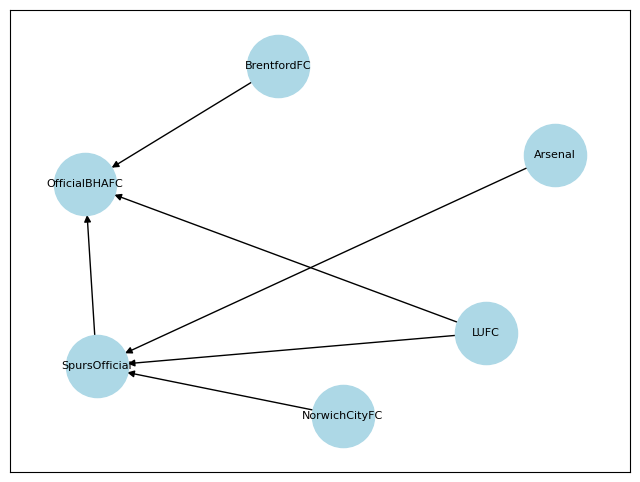

In [59]:
plt.figure(figsize=(8, 6))
plt.margins(0.1, 0.1)
pos = nx.spring_layout(reply_graph, k = 2.2)
nx.draw_networkx(reply_graph, pos, with_labels = True, node_size=2000, font_size=8, node_color="lightblue")

This visualisation indicates that it is not common for clubs to reply to other clubs' tweets.

This is another directed network, however this time it is weighted. Let's calculate the weighted in-degree and weighted out-degree distributions

In [60]:
in_deg3 = pd.Series(dict(reply_graph.in_degree(weight="weight")), name="w-in-degree")
pd.DataFrame(in_deg3).sort_values(by="w-in-degree", ascending=False).head(10)

,w-in-degree
SpursOfficial,3
OfficialBHAFC,3
NorwichCityFC,0
LUFC,0
BrentfordFC,0
Arsenal,0


Brighton and Spurs are the only clubs that have received replies

In [61]:
wout_degrees3 = pd.Series(dict(reply_graph.out_degree(weight="weight")), name="w-out-degree")
pd.DataFrame(wout_degrees3).sort_values(by="w-out-degree", ascending=False).head(10)

,w-out-degree
LUFC,2
SpursOfficial,1
NorwichCityFC,1
BrentfordFC,1
Arsenal,1
OfficialBHAFC,0


Leeds United have replied to the most tweets in this network

## Task 4: User-hashtag network
### Data exploration and cleaning

In [62]:
users = pd.DataFrame(users_data).set_index("id")
users.head()

,id_str,name,screen_name,location,description,url,entities,protected,followers_count,friends_count,...,profile_text_color,profile_use_background_image,has_extended_profile,default_profile,default_profile_image,following,follow_request_sent,notifications,translator_type,withheld_in_countries
id,,,,,,,,,,,,,,,,,,,,,
1024095475,1024095475,Leeds United,LUFC,Elland Road Stadium,The official Twitter account for Leeds United ...,https://t.co/Bhj3TGUbTq,{'url': {'urls': [{'url': 'https://t.co/Bhj3TG...,False,998332,105,...,333333,True,True,False,False,False,False,False,none,[]
773069256,773069256,FC Bayern München,FCBayern,"Säbener Straße, München",#FCBayern 🗺 @FCBayernEN 🇬🇧 @FCBayernES 🇪🇸 @FCB...,https://t.co/P4MezQCXfX,{'url': {'urls': [{'url': 'https://t.co/P4MezQ...,False,6573886,43,...,333333,True,True,False,False,False,False,False,none,[]
558797310,558797310,Manchester United,ManUtd,"Old Trafford, Manchester",The home of Manchester United.,None,{'description': {'urls': []}},False,33985732,174,...,333333,True,False,False,False,True,False,False,regular,[]
419507602,419507602,Hibernian Football Club,HibernianFC,Leith • Edinburgh • Scotland,Hibs 𝘀𝗶𝗻𝗰𝗲 𝟭𝟴𝟳𝟱.,https://t.co/fLiEdpEINE,{'url': {'urls': [{'url': 'https://t.co/fLiEdp...,False,106319,431,...,333333,False,False,False,False,False,False,False,none,[]
351838853,351838853,Rangers Football Club,RangersFC,"Glasgow, Scotland",The Home of #RangersFC,https://t.co/XsrkWmhnLr,{'url': {'urls': [{'url': 'https://t.co/XsrkWm...,False,762883,290,...,000000,True,False,False,False,False,False,False,none,[]


I will standardise the screen names to all be lowercase, and then set this as the dataframe row index

In [63]:
users["screen_name"] = users["screen_name"].str.lower()
users = users.set_index("screen_name")
users.head()

,id_str,name,location,description,url,entities,protected,followers_count,friends_count,listed_count,...,profile_text_color,profile_use_background_image,has_extended_profile,default_profile,default_profile_image,following,follow_request_sent,notifications,translator_type,withheld_in_countries
screen_name,,,,,,,,,,,,,,,,,,,,,
lufc,1024095475,Leeds United,Elland Road Stadium,The official Twitter account for Leeds United ...,https://t.co/Bhj3TGUbTq,{'url': {'urls': [{'url': 'https://t.co/Bhj3TG...,False,998332,105,3680,...,333333,True,True,False,False,False,False,False,none,[]
fcbayern,773069256,FC Bayern München,"Säbener Straße, München",#FCBayern 🗺 @FCBayernEN 🇬🇧 @FCBayernES 🇪🇸 @FCB...,https://t.co/P4MezQCXfX,{'url': {'urls': [{'url': 'https://t.co/P4MezQ...,False,6573886,43,8115,...,333333,True,True,False,False,False,False,False,none,[]
manutd,558797310,Manchester United,"Old Trafford, Manchester",The home of Manchester United.,None,{'description': {'urls': []}},False,33985732,174,26331,...,333333,True,False,False,False,True,False,False,regular,[]
hibernianfc,419507602,Hibernian Football Club,Leith • Edinburgh • Scotland,Hibs 𝘀𝗶𝗻𝗰𝗲 𝟭𝟴𝟳𝟱.,https://t.co/fLiEdpEINE,{'url': {'urls': [{'url': 'https://t.co/fLiEdp...,False,106319,431,681,...,333333,False,False,False,False,False,False,False,none,[]
rangersfc,351838853,Rangers Football Club,"Glasgow, Scotland",The Home of #RangersFC,https://t.co/XsrkWmhnLr,{'url': {'urls': [{'url': 'https://t.co/XsrkWm...,False,762883,290,1833,...,000000,True,False,False,False,False,False,False,none,[]


Twitter profiles provide a large number of descriptive features for each user.

I will drop some columns that are not especially useful:

In [64]:
users = users.drop( ['id_str',
        'contributors_enabled',
        'default_profile',
        'default_profile_image',
        'entities',
        'follow_request_sent',
        'following',
        'has_extended_profile',
        'is_translation_enabled',
        'is_translator',
        'translator_type',
        'lang',
        'notifications',
        'profile_background_color',
        'profile_background_tile',
        'profile_banner_url',
        'profile_image_url',
        'profile_image_url_https',
        'profile_link_color',
        'profile_sidebar_border_color',
        'profile_sidebar_fill_color',
        'profile_text_color',
        'profile_background_image_url',
        'profile_background_image_url_https',
        'profile_use_background_image',
        'time_zone',
        'url',
        'utc_offset'], axis=1 )

I will use the convenience function provided in the lab notebook 16 to parse Twitter's date string values:

In [65]:
from datetime import datetime
from email.utils import parsedate

def parse_twitter_date( s ):
    parts = parsedate(s)
    return datetime(*(parts[:6]))

This will allow me to parse the 'created_at' field, which provides the date for when the account was created:

In [66]:
for i, d in users["created_at"].items():
    users.loc[i, "created_at"] = parse_twitter_date( d )

I will also remove the status column, which contains a dictionary representing a user's most recent tweet, and replace it with extra columns

In [67]:
for i, status in users["status"].items():
    users.loc[i, "last_tweet_date"] = parse_twitter_date( status["created_at"] )
    users.loc[i, "last_tweet"] = status["text"]
# drop the column when we are finished
users = users.drop( ['status'], axis=1)

In [68]:
users.head()

,name,location,description,protected,followers_count,friends_count,listed_count,created_at,favourites_count,geo_enabled,verified,statuses_count,withheld_in_countries,last_tweet_date,last_tweet
screen_name,,,,,,,,,,,,,,,
lufc,Leeds United,Elland Road Stadium,The official Twitter account for Leeds United ...,False,998332,105,3680,2012-12-20 11:43:17,2825,True,True,54364,[],2022-11-20 09:27:56,"RT @lufcsz: 🎉 Happy birthday, @Harrison_Jack11..."
fcbayern,FC Bayern München,"Säbener Straße, München",#FCBayern 🗺 @FCBayernEN 🇬🇧 @FCBayernES 🇪🇸 @FCB...,False,6573886,43,8115,2012-08-22 07:10:46,10857,True,True,81900,[],2022-11-19 15:27:47,"Glückwunsch zum Sieg, Mädels! 👏\n\n#MiaSanMia ..."
manutd,Manchester United,"Old Trafford, Manchester",The home of Manchester United.,False,33985732,174,26331,2012-04-20 15:17:43,5259,True,True,77717,[],2022-11-20 10:00:01,"2️⃣0️⃣,3️⃣4️⃣3️⃣ unique participants\n7️⃣1️⃣% ..."
hibernianfc,Hibernian Football Club,Leith • Edinburgh • Scotland,Hibs 𝘀𝗶𝗻𝗰𝗲 𝟭𝟴𝟳𝟱.,False,106319,431,681,2011-11-23 12:48:45,10773,True,True,73189,[],2022-11-20 11:06:35,RT @HibernianWomen: Today's team to face Glasg...
rangersfc,Rangers Football Club,"Glasgow, Scotland",The Home of #RangersFC,False,762883,290,1833,2011-08-09 20:08:17,1050,True,True,98476,[],2022-11-20 10:58:07,RT @RangersWFC: ⚡️ It's MATCHDAY!\n\n🆚 Glasgow...


In [69]:
users.index.values

array(['lufc', 'fcbayern', 'manutd', 'hibernianfc', 'rangersfc',
       'aberdeenfc', 'stjohnstone', 'watfordfc', 'norwichcityfc', 'bvb',
       'westham', 'lcfc', 'spursofficial', 'brentfordfc', 'fcbarcelona',
       'cpfc', 'livifcofficial', 'sheffieldunited', 'officialbhafc',
       'wolves', 'southamptonfc', 'psg_inside', 'nufc', 'arsenal',
       'avfcofficial', 'dundeeunitedfc', 'chelseafc', 'fulhamfc',
       'afcbournemouth', 'lfc', 'everton', 'celticfc', 'realmadrid',
       'mancity'], dtype=object)

### Construction

I will be creating a bipartite network. Set one will be the football clubs and set 2 will be the hashtags that they have tweeted. Hashtags of club names will be excluded as they would overlap with the set one, thus making the bipartite network invalid 

How:
- initialise user and hashtag sets
- initiliase a counter for club hashtag pairs
- iterrate over each tweet in tweets, if the club has not been added to the users set yet, add them and their node to the network
- for each hashtag in the tweet, if it is not in set one and not the club's name, add it to the hashtag set and to the network
- update the pair count if it is a valid hashtag

In [70]:
users_set = set()
hashtags_set = set()
user_hashtag_graph = nx.Graph()

In [71]:
hashtag_counts = Counter()
for i, row in tweets.iterrows():
    # add the user node
    if not row["user_screen_name"] in users_set:
        users_set.add( row["user_screen_name"] )
        user_hashtag_graph.add_node( row["user_screen_name"], bipartite=0 )
    # add the hashtag node(s)
    for hashtag in row["used hashtags"]:
        if not hashtag in users_set and row["user_screen_name"] != hashtag:
            hashtags_set.add( hashtag )
            user_hashtag_graph.add_node( hashtag, bipartite=1 )
        # update the counts
        if not hashtag in users_set and row["user_screen_name"] != hashtag: 
            pair = frozenset([row["user_screen_name"], hashtag])
            hashtag_counts[pair] += 1

In [72]:
for pair in hashtag_counts:
    user_hashtag_graph.add_edge( *pair, weight=hashtag_counts[pair] )

In [73]:
print( "Bipartite graph: %d nodes, %d edges" % ( user_hashtag_graph.number_of_nodes(), user_hashtag_graph.number_of_edges() ) )
print( "%d users, %d hashtags" % ( len(users_set), len(hashtags_set) ) )

Bipartite graph: 1142 nodes, 1607 edges
34 users, 1108 hashtags


In [74]:
from networkx.algorithms import bipartite
bipartite.is_bipartite( user_hashtag_graph)

True

The bipartite network has been successfully created.

Now let's visualise the network using a standard bipartite left-right layout for the two sets:

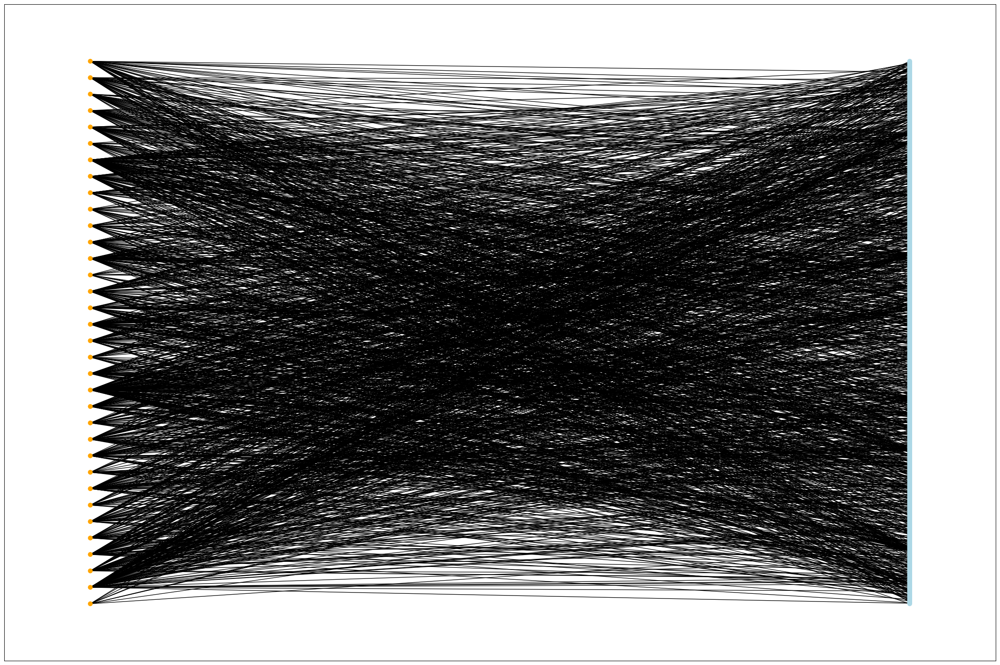

In [75]:
# get the positions for the nodes
pos = nx.bipartite_layout(user_hashtag_graph, users_set)
# manually set the colors for nodes in both sets
color_map = {}
for i, node in enumerate(users_set):
    color_map[node] = "orange"
for i, node in enumerate(hashtags_set):
    color_map[node] = "lightblue"
colors = [color_map[node] for node in user_hashtag_graph.nodes()]
# create the figure
plt.figure(figsize=(30, 20))
# draw the network with the specified positions and colors
nx.draw_networkx(user_hashtag_graph, pos=pos, with_labels=False, node_color = colors, node_size = 50)
plt.show()

There are over 1000 nodes in the hashtag set, this results in an unappealing network graph.

Let's characterise the network and make more appealing visualisations

Check if the network is connected - i.e. contains a single connected component:

In [76]:
nx.number_connected_components(user_hashtag_graph)

1

Let's look at the most tweeted hashtags, based on weighted degree:

In [77]:
hash_wdegrees = dict(user_hashtag_graph.degree(hashtags_set, weight="weight"))
hash_swdeg = pd.Series(hash_wdegrees, name="w-degree")
hash_swdeg = hash_swdeg.sort_values(ascending=False)
# display the top 10
pd.DataFrame(hash_swdeg.head(10))

,w-degree
UCL,884
NCFC,780
cinchPrem,775
MUFC,746
UnitedInPursuit,583
cinchPremiership,563
COYBIG,439
StandFree,399
SJFC,373
LFCLive,360


Let's plot the distribution:

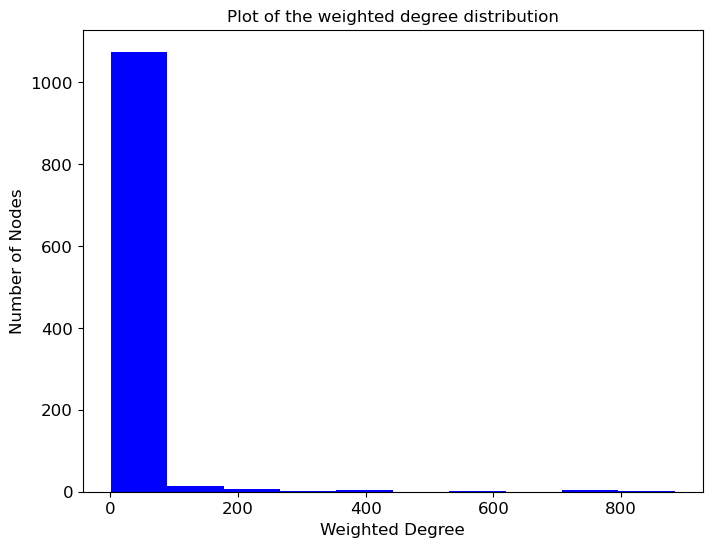

In [78]:
ax1 = hash_swdeg.plot.hist(figsize=(8,6), fontsize=12, legend=None, color="blue")
ax1.set_ylabel("Number of Nodes", fontsize=12)
ax1.set_xlabel("Weighted Degree", fontsize=12);
plt.title("Plot of the weighted degree distribution");

The plot is heavily skewed to the left, the majority of hashtags have a weighted degree of less than ~100

Let's look at the users tweeting the most hashtags, based on weighted degree:

In [79]:
user_wdegrees = dict(user_hashtag_graph.degree(users_set, weight="weight"))
user_swdeg = pd.Series(user_wdegrees, name="w-degree")
user_swdeg = user_swdeg.sort_values(ascending=False)
# display the top 10
pd.DataFrame(user_swdeg.head(10))

,w-degree
CelticFC,1775
ManUtd,1501
FCBayern,1210
dundeeunitedfc,1174
NorwichCityFC,1095
PSG_inside,967
StJohnstone,954
FulhamFC,816
AberdeenFC,805
BVB,769


Let's plot the distribution:

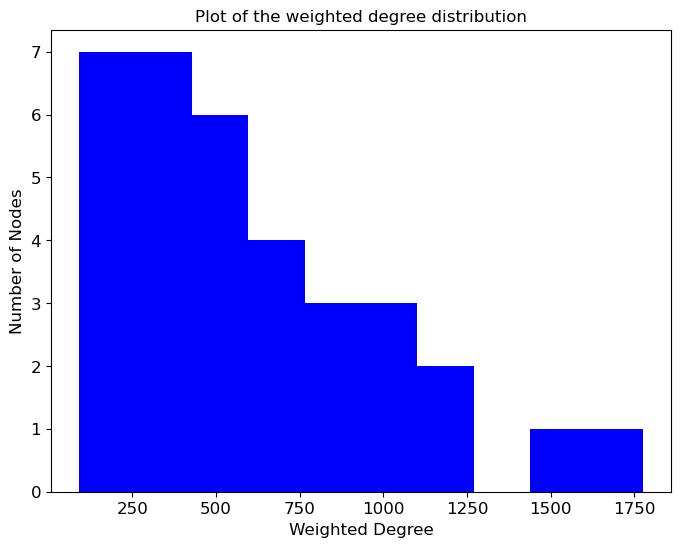

In [80]:
ax1 = user_swdeg.plot.hist(figsize=(8,6), fontsize=12, legend=None, color="blue")
ax1.set_ylabel("Number of Nodes", fontsize=12)
ax1.set_xlabel("Weighted Degree", fontsize=12);
plt.title("Plot of the weighted degree distribution");

Again the plot is skewed to the left, however this time it is not as extreme. 

### Projected Networks
Let's create a projected network which will show the extent to which different hashtags overlap in terms of users. 

To do this, calculate a weighted projection onto the tweeter of hashtags.

In [81]:
t = bipartite.weighted_projected_graph(user_hashtag_graph, hashtags_set)
print( "Projected graph: %d nodes, %d edges" % ( t.number_of_nodes(), t.number_of_edges() ) )

Projected graph: 1108 nodes, 43970 edges


Let's draw the network

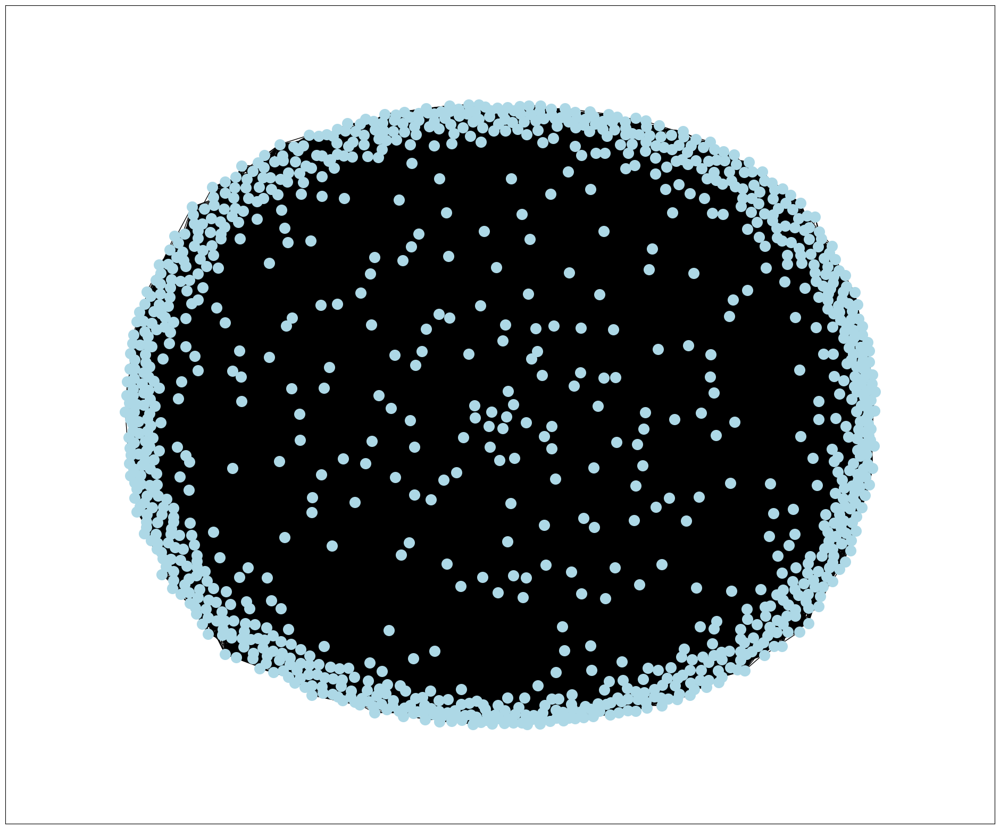

In [82]:
plt.figure(figsize=(24, 20))
plt.margins(0.1, 0.1)
pos = nx.spring_layout(t, k = 2.2)
nx.draw_networkx(t, pos, with_labels = False, node_size=200, node_color="lightblue")

Which hashtags are at the center of this projected network?

In [83]:
wdegrees4 = dict(t.degree(weight="weight"))
# convert to a Pandas series and sort it
swdeg4 = pd.Series(wdegrees4, name="w-degree")
swdeg4 = swdeg4.sort_values(ascending=False)
# display the top 10
pd.DataFrame(swdeg4.head(10))

,w-degree
FIFAWorldCup,967
RainbowLaces,954
OnThisDay,944
FIFA23,839
UCL,708
BlackHistoryMonth,678
PL2,678
TOTW,635
OTD,628
LestWeForget,519


Let's look at which hashtags appeared together the most in tweets:

In [84]:
df4 = nx.to_pandas_edgelist(t)
df4.sort_values(by="weight", ascending=False).head(10)

,source,target,weight
16240,FIFAWorldCup,RainbowLaces,19
22803,RainbowLaces,OnThisDay,17
16404,FIFAWorldCup,FIFA23,16
22719,RainbowLaces,FIFA23,15
14045,BlackHistoryMonth,RainbowLaces,15
35517,FIFA23,OnThisDay,15
22823,RainbowLaces,PL2,15
13963,BlackHistoryMonth,FIFAWorldCup,15
16504,FIFAWorldCup,OnThisDay,15
16524,FIFAWorldCup,PL2,13


Let's apply thresholding to the projected network to visualise the most tweeted hashtags 

In [85]:
def apply_thresholding(network, t=2): #default thresholded value is 2
    thresholded = network.copy()
    for edge in network.edges(data=True):
        #remove all edges, as they are weighted
        thresholded.remove_edge(edge[0], edge[1])
        #add a binary edge if weight is at or above threshold
        if edge[2]["weight"] >= t:
            thresholded.add_edge(edge[0], edge[1])
            
    return thresholded

In [86]:
t2 = apply_thresholding(t, 8)
print( "Projected graph: %d nodes, %d edges" % ( t2.number_of_nodes(), t2.number_of_edges() ) )

Projected graph: 1108 nodes, 72 edges


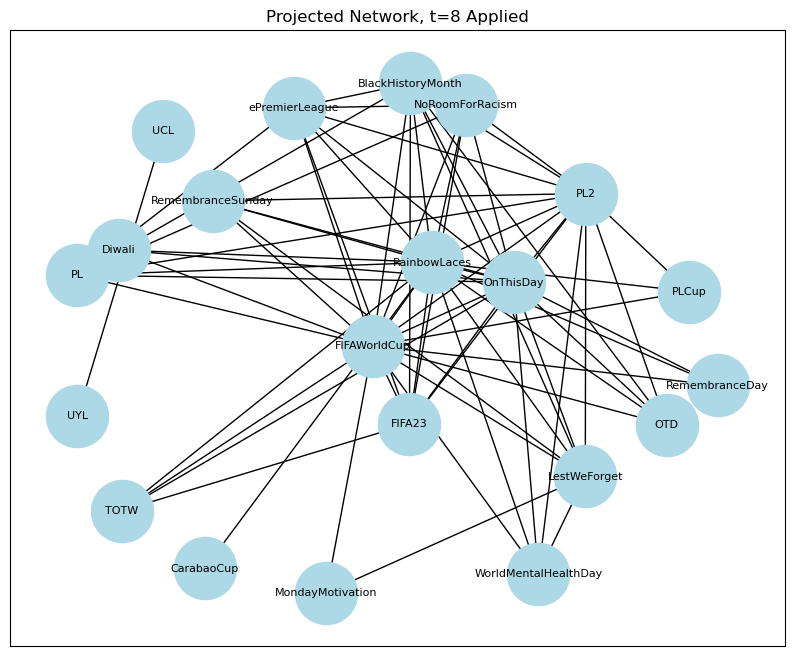

In [87]:
#remove isolates
t2.remove_nodes_from(list(nx.isolates(t2)))
#draw resulting network
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(t2, k=2.2)
nx.draw_networkx(t2, pos, with_labels=True, node_size=2000, font_size=8, node_color="lightblue")
plt.title("Projected Network, t=8 Applied")
plt.show()

#### Another projection
Let's create another projected network. This time it will show the extent to which user's overlap on which hashtags they tweet.

In [88]:
p4 = bipartite.weighted_projected_graph(user_hashtag_graph, users_set)
print( "Projected graph: %d nodes, %d edges" % ( p4.number_of_nodes(), p4.number_of_edges() ) )

Projected graph: 34 nodes, 508 edges


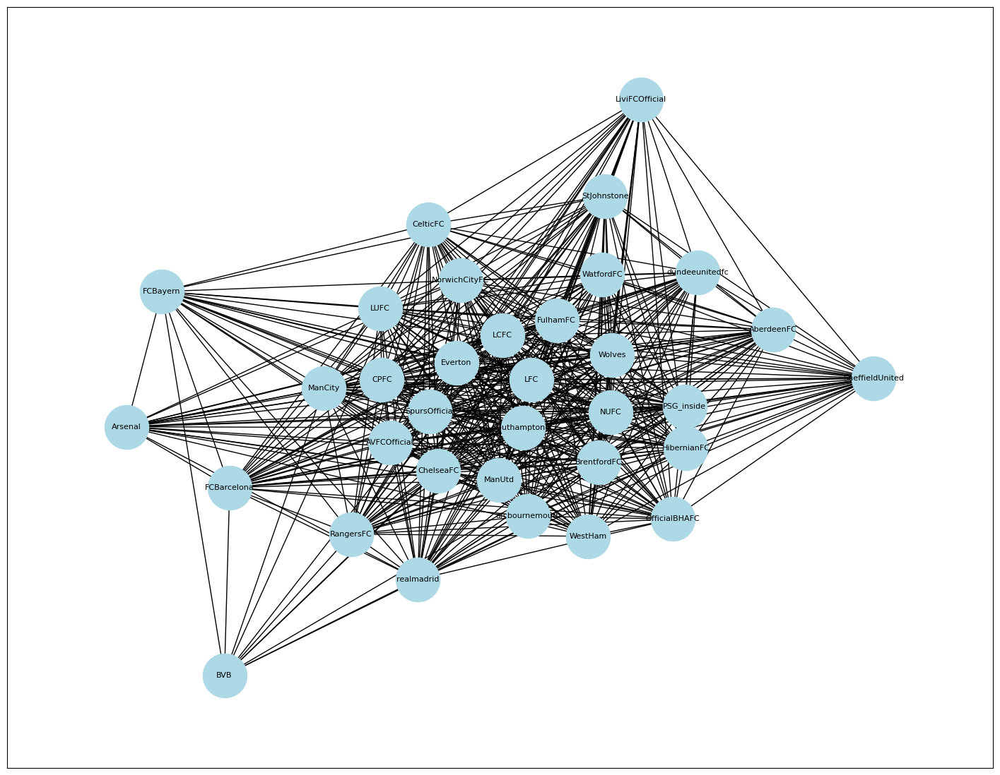

In [89]:
plt.figure(figsize=(18,14))
plt.margins(0.1, 0.1)
pos = nx.spring_layout(p4, k=2.2)
nx.draw_networkx(p4, pos, with_labels=True, font_size=8, node_size=2000, node_color="lightblue")
plt.show();

Which clubs are at the center of this network?

In [90]:
p4_wdegrees = dict(p4.degree(weight="weight"))
# convert to a Pandas series and sort it
p4_swdeg = pd.Series(p4_wdegrees, name="w-degree")
p4_swdeg = p4_swdeg.sort_values(ascending=False)
# display the top 10
pd.DataFrame(p4_swdeg.head(10))

,w-degree
LCFC,235
Everton,232
SouthamptonFC,229
AVFCOfficial,217
CPFC,211
ChelseaFC,211
SpursOfficial,205
FulhamFC,202
Wolves,199
BrentfordFC,198


Highest number of overlaps between hashtags in terms of common tweeters

In [91]:
p4_df = nx.to_pandas_edgelist(p4)
p4_df.sort_values(by="weight", ascending=False).head(10)

,source,target,weight
183,Everton,LCFC,15
299,SouthamptonFC,AVFCOfficial,14
298,SouthamptonFC,Wolves,14
295,SouthamptonFC,LCFC,14
395,LCFC,AVFCOfficial,14
181,Everton,FulhamFC,13
187,Everton,AVFCOfficial,13
328,ManUtd,AVFCOfficial,13
177,Everton,SouthamptonFC,13
43,CPFC,Everton,13


Let's look at the ego network for one particular club. This might suggest other clubs of similar geographical location, pedigree and twitter activity.

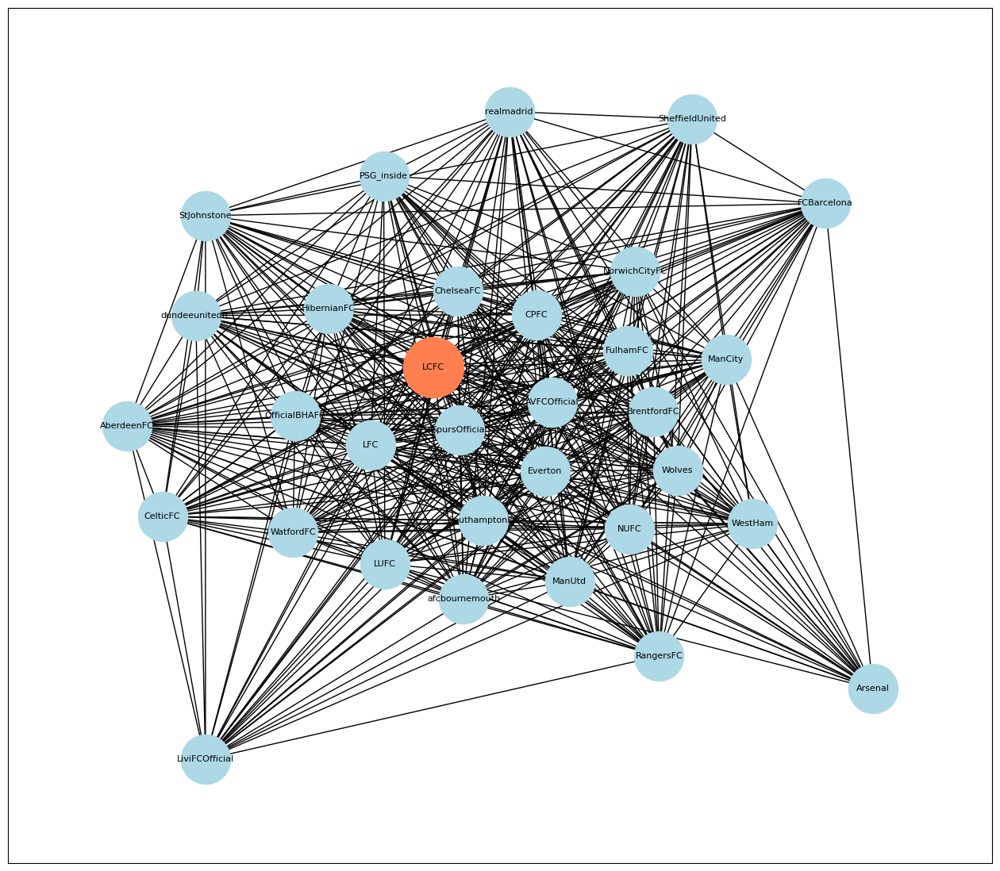

In [92]:
ego_node4 = "LCFC"
ego4 = nx.ego_graph(p4, ego_node4)
plt.figure(figsize=(16,14)) 
plt.margins(0.1, 0.1)
# apply layout algorithm to calculate node positions
pos = nx.spring_layout(ego4, k=2.2)
# draw the nodes and edges
nx.draw_networkx(ego4, pos, with_labels = True, node_size=2000, font_size=8, node_color="lightblue")
# draw the ego in red, with larger node size
nx.draw_networkx_nodes(ego4, pos, nodelist=[ego_node4], node_size=3000, node_color="coral")
plt.show();

In [93]:
print("The density of the ego network is {}".format(round(nx.density(ego4), 2)))
print("The ego-network is connected: {}".format(nx.is_connected(ego4)))
print("The diameter of the ego network is {}".format(nx.diameter(ego4)))
print("The average clustering of the ego network is {}".format(round(nx.average_clustering(ego4), 2)))

The density of the ego network is 0.96
The ego-network is connected: True
The diameter of the ego network is 2
The average clustering of the ego network is 0.97


#### Characterising the ego-network of LCFC
- With a density of 96%, the ego network is very dense.

- The ego-network is connected and is very well linked, as shown by the length of its diameter. However, the diameter of an ego network is always going to be 2 as the ego node is connected to every node in the network. In the rare case that every node in the ego network are linked, then the diameter will be 1.

- The average clustering is high, meaning that the nodes are very clustered together. 




### Task 5: Hashtag Co-occurence network

In [94]:
pair_counts = Counter()
for i, tweet in tweets.iterrows():
    hashtag_pairs = list(itertools.combinations(tweet["used hashtags"], r=2))
    for pair in hashtag_pairs:
        pair_counts[pair] += 1


In [95]:
g5 = nx.Graph()
for pair in pair_counts:
    if pair[0] in users_set or pair[1] in users_set or pair[0]==pair[1]:
        continue
    g5.add_edge(pair[0], pair[1], weight=pair_counts[pair])

In [96]:
print("{} nodes and {} edges in the network".format(g5.number_of_nodes(), g5.number_of_edges()))
print("Density: {}".format(round(nx.density(g5), 2)))
print("Is the network connected?: {}".format(nx.is_connected(g5)))
print("Average Clustering Coefficient: {}".format(round(nx.average_clustering(g5), 3)))

739 nodes and 1532 edges in the network
Density: 0.01
Is the network connected?: False
Average Clustering Coefficient: 0.346


- The network is very sparse
- The network is not connected
- The average clustering of 34.6% indicates a not very linked network

Let's draw the network

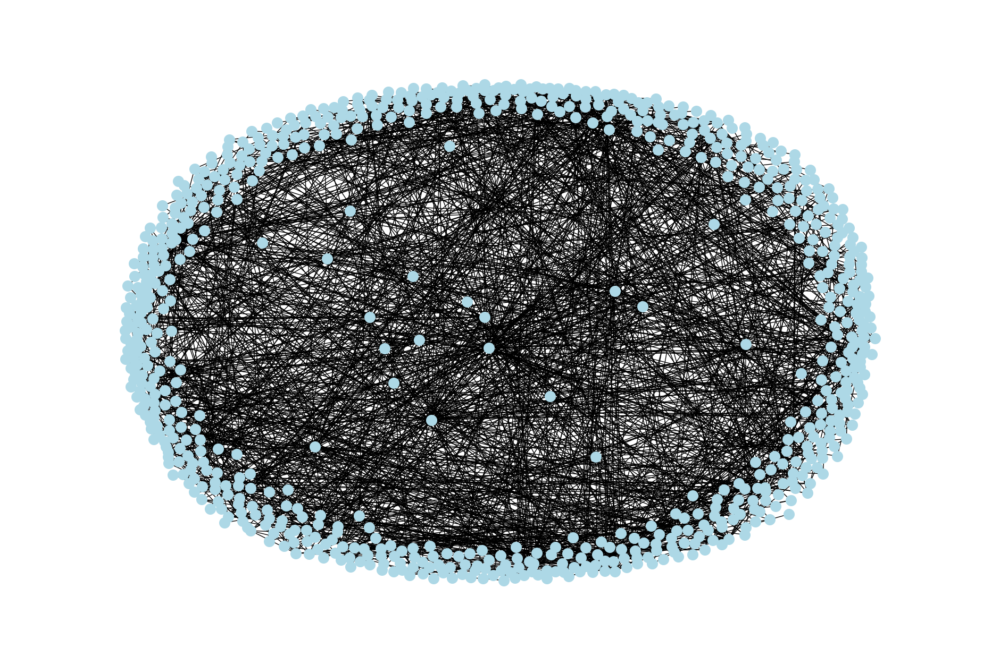

In [97]:
plt.figure(figsize=(24,16))
plt.margins(0.1, 0.1)
pos = nx.spring_layout(g5, k=2.2)
nx.draw_networkx(g5, pos, with_labels=False, node_size=200, node_color="lightblue")
plt.axis("off");

We can see that the majority of nodes are scattered accross the outskirts of the graph, while there are some strong central nodes 

As the network is not connected, let's create a subgraph of its largest component and characterise it

In [98]:
connected5 = []
for c in nx.connected_components(g5):
    connected5.append(list(c))

sg5 = nx.subgraph(g5, max(connected5, key=len))

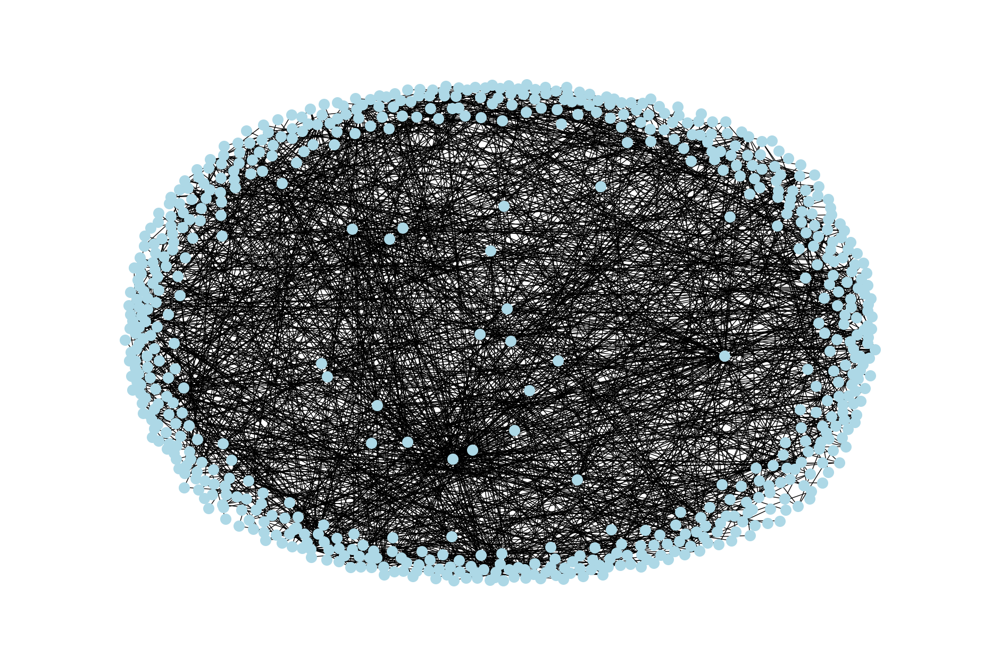

In [99]:
plt.figure(figsize=(24,16))
plt.margins(0.1, 0.1)
pos = nx.spring_layout(sg5, k=2.2)
nx.draw_networkx(sg5, pos, with_labels=False, node_size=200, node_color="lightblue")
plt.axis("off");

This grpah doesn't appear to be much different from the previous, let's characterise it.

In [100]:
print("{} nodes and {} edges in the network".format(sg5.number_of_nodes(), sg5.number_of_edges()))
print("Density: {}".format(round(nx.density(sg5), 2)))
print("Diameter: {}".format(nx.diameter(sg5)))
print("Is the network connected?: {}".format(nx.is_connected(sg5)))
print("Average Clustering Coefficient: {}".format(round(nx.average_clustering(sg5), 3)))

640 nodes and 1455 edges in the network
Density: 0.01
Diameter: 10
Is the network connected?: True
Average Clustering Coefficient: 0.359


- The sub network has the same density
- The longest shortest path of the network is 10, indicating that the network is not that well linked
- It has a slightly greater average clustering which indicates that it is better linked

Let's calculate the network's weighted degree distribution

In [101]:
s5 = pd.Series(dict(sg5.degree(weight="weight")))
print("Weighted Degree Range: [{}, {}]".format(s5.min(), s5.max()))
print("Mean Weighted Degree: {}".format(s5.mean()))
print("Median Weighted Degree: {}".format(s5.median()))

Weighted Degree Range: [1, 451]
Mean Weighted Degree: 13.890625
Median Weighted Degree: 4.0


Let's generate a plot of the weighted degree distribution

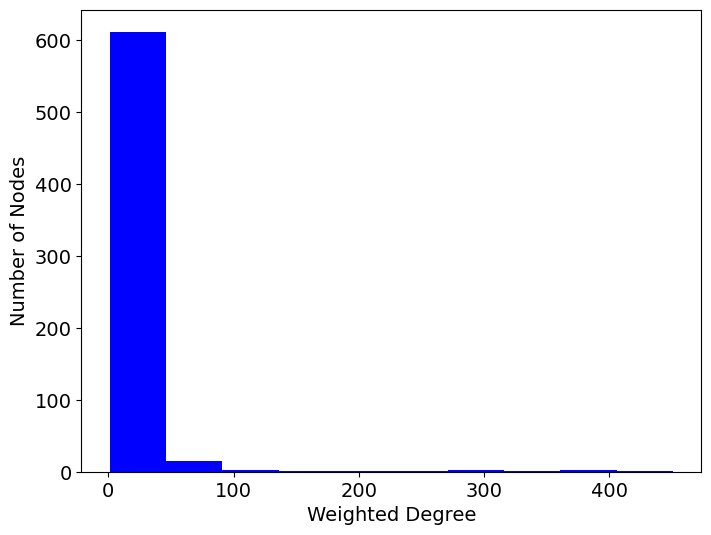

In [102]:
ax1 = s5.plot.hist(figsize=(8,6), fontsize=14, legend=None, color="blue")
ax1.set_ylabel("Number of Nodes", fontsize=14)
ax1.set_xlabel("Weighted Degree", fontsize=14);

The histogram is heavily skewed to the left, the majority of nodes have a weighted degree of less than ~50

As we saw in the weighted centrality distribution, the majority of the nodes in the network have a weighted centrality of less than 50. Let's apply thresholding to visualise the hashtags which are paired the most often

In [103]:
t5 = apply_thresholding(g5, 50)

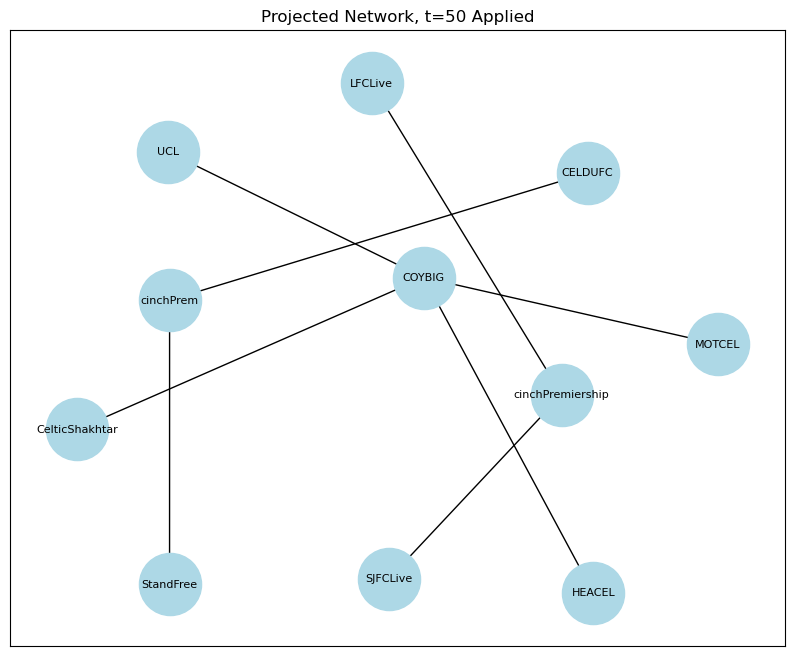

In [104]:
#remove isolates
t5.remove_nodes_from(list(nx.isolates(t5)))
#draw resulting network
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(t5, k=2.2)
nx.draw_networkx(t5, pos, with_labels=True, node_size=2000, font_size=8, node_color="lightblue")
plt.title("Projected Network, t=50 Applied")
plt.show()

Let's calculate more centrality measures

In [105]:
df5 = pd.DataFrame(s5,columns=["weighted_degree_centrality"])
df5.sort_values(by="weighted_degree_centrality",ascending=False).head(10)

,weighted_degree_centrality
cinchPremiership,451
COYBIG,385
cinchPrem,385
LFCLive,344
StandFree,303
NCFC,302
UCL,290
UnitedInPursuit,270
MUFC,184
MiaSanMia,147


In [106]:
df5["weighted_eigenvector_centrality"] = pd.Series(dict(nx.eigenvector_centrality(sg5, weight="weight", tol=1.0e-3)))
df5.sort_values(by="weighted_eigenvector_centrality",ascending=False).head(10)

,weighted_degree_centrality,weighted_eigenvector_centrality
LFCLive,344,0.704509
cinchPremiership,451,0.582939
StandFree,303,0.278457
cinchPrem,385,0.232651
SJFCLive,96,0.163434
CELDUFC,62,0.053953
COYS,32,0.029991
COYBIG,385,0.019123
MOTCEL,116,0.013288
UCL,290,0.012911


In [107]:
df5["weighted_betweenness_centrality"] = pd.Series(dict(nx.betweenness_centrality(sg5, weight="weight")))
df5.sort_values(by="weighted_betweenness_centrality",ascending=False).head(10)

,weighted_degree_centrality,weighted_eigenvector_centrality,weighted_betweenness_centrality
UCL,290,0.012911,0.486195
FIFA23,42,0.000115,0.295012
PL,57,0.000014,0.184880
MiaSanMia,147,0.000485,0.124541
SaintsFC,63,0.000005,0.111474
COYBIG,385,0.019123,0.111299
FIFAWorldCup,47,0.000052,0.111192
OTD,13,0.000098,0.086830
OnThisDay,15,0.000118,0.085986
RainbowLaces,31,0.000022,0.084435


As this is a co-occurence network, a nodes' weighted degree and eigenvector centralities are the most important, in that order. Therefore we can conclude that cinchPremiership is the most imporant node in this network. 

Let's generate the ego network of cinchPremiership, which will help identify hashtags which appear often with cinchPremiership

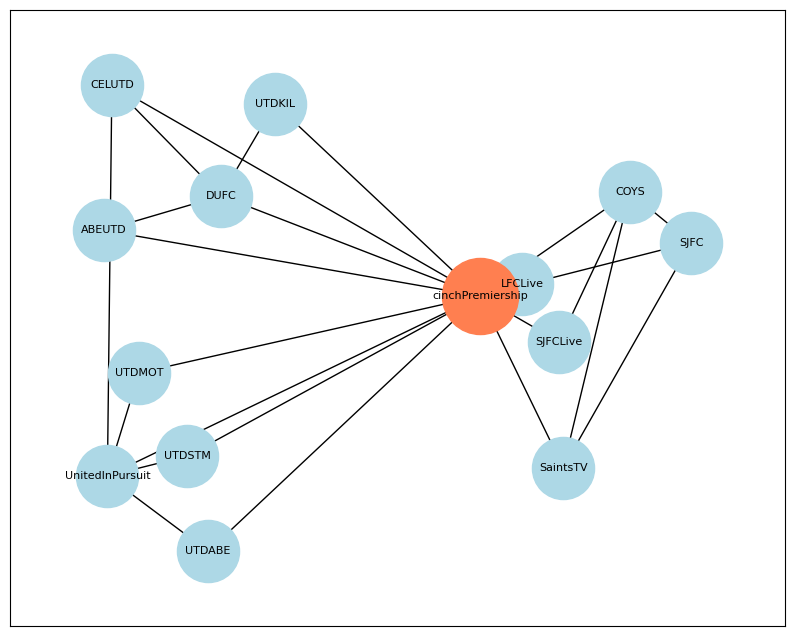

In [108]:
ego_node5 = "cinchPremiership"
ego5 = nx.ego_graph(sg5, ego_node5)
plt.figure(figsize=(10,8)) 
plt.margins(0.1, 0.1)
# apply layout algorithm to calculate node positions
pos = nx.spring_layout(ego5, k=2.2)
# draw the nodes and edges
nx.draw_networkx(ego5, pos, with_labels = True, node_size=2000, font_size=8, node_color="lightblue")
# draw the ego in red, with larger node size
nx.draw_networkx_nodes(ego5, pos, nodelist=[ego_node5], node_size=3000, node_color="coral")
plt.show();

## Task 6: Dynamic Follower Network
### Construction 
- I will be using the dataframe from task 1
- The date column is of type "Timestamp" which will allow for comparison of dates
- I will construct 3 time windows of approximately equal length, and then analyse them 

First, let's look at the range of timestamps in the data:

In [109]:
min_date = follower_data["date"].min()
max_date = follower_data["date"].max()
print("Date range: %s to %s" % (min_date, max_date) )

Date range: 2020-01-02 00:00:00 to 2022-12-27 00:00:00


Let's divide the data into 3 windows of approximately equal size.

In [110]:
num_windows = 3

From this, we can calculate the size of each window

In [111]:
((max_date - min_date)/num_windows).round("d")

Timedelta('363 days 00:00:00')

The window size is 363 days, almost one year!

Now we will split our original Data Frame into a series of frames, one per window.

In [112]:
#define window size as an int
window_size = 363
window_frames = []
#set current date as the min date
current_date = min_date
for window_number in range(1,num_windows+1):
    # set the current window range
    win_min = current_date
    win_max = win_min + timedelta(days=window_size)
    # handle the last window correctly, so we don't lose data
    if window_number == num_windows:
        wf = follower_data[(follower_data["date"]>=win_min) & (follower_data["date"]<=win_max)]
    else:
        # otherwise we exclude the last day
        wf = follower_data[(follower_data["date"]>=win_min) & (follower_data["date"]<win_max)]
    window_frames.append( wf )
    print("Window {}: Date {} to {} -> {} interactions".format(window_number, win_min, (win_max-timedelta(days=1)), len(wf)))
    # increment
    current_date = current_date + timedelta(days=window_size)

Window 1: Date 2020-01-02 00:00:00 to 2020-12-29 00:00:00 -> 153 interactions
Window 2: Date 2020-12-30 00:00:00 to 2021-12-27 00:00:00 -> 90 interactions
Window 3: Date 2021-12-28 00:00:00 to 2022-12-25 00:00:00 -> 82 interactions


In [113]:
# check each of the data frames
for wf in window_frames:
    print(wf.head(3))
    print()

           source           target       date
1  livifcofficial      stjohnstone 2020-09-17
4   norwichcityfc  sheffieldunited 2020-08-21
7             lfc    officialbhafc 2020-03-27

           source     target       date
15  norwichcityfc  watfordfc 2021-09-28
16            lfc     wolves 2021-09-09
18      watfordfc  chelseafc 2021-04-07

           source         target       date
0  dundeeunitedfc  southamptonfc 2022-11-26
2       watfordfc            lfc 2022-10-09
3   norwichcityfc           cpfc 2022-03-26



Create an undirected network for each time window

In [114]:
window_networks = []
for w in range(num_windows):
    # create the undirected network from the corresponding DataFrame
    g = nx.from_pandas_edgelist(window_frames[w], "source", "target", create_using=nx.DiGraph())  
    print("Window %d network has %d nodes, %d edges" % ( (w+1), g.number_of_nodes(), g.number_of_edges()  ) )
    window_networks.append(g)

Window 1 network has 33 nodes, 153 edges
Window 2 network has 33 nodes, 90 edges
Window 3 network has 31 nodes, 82 edges


Let's visualise each window network:

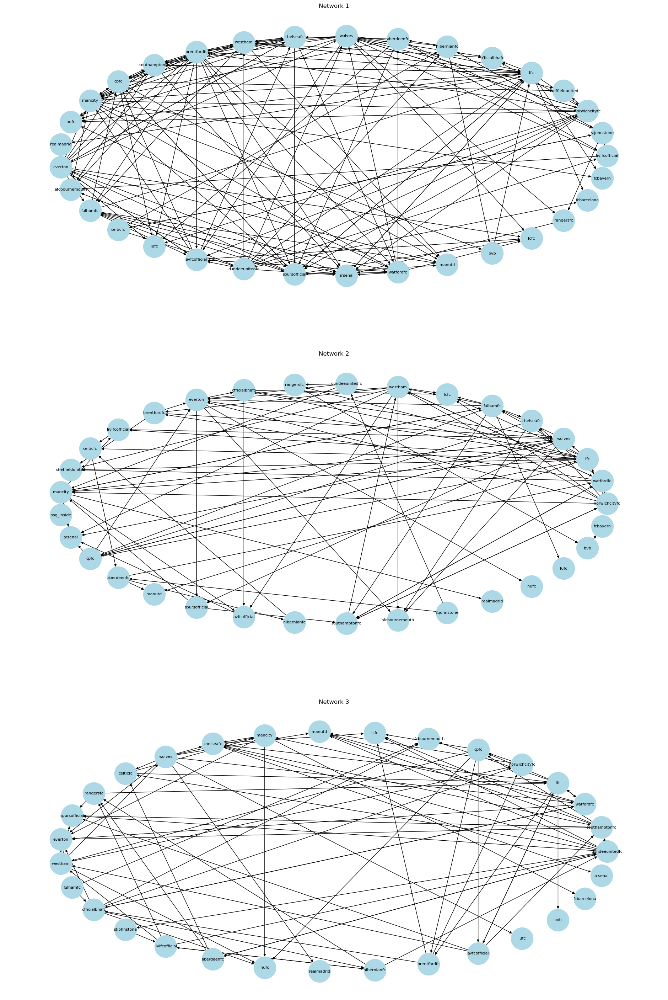

In [115]:
fig, ax = plt.subplots(3,1, figsize=(24,36))
row, col = 0, 0
for i in range(0, 3):
    pos = nx.circular_layout(window_networks[i])
    # draw the network as a subplot
    nx.draw_networkx(window_networks[i], pos, 
                     ax=ax[row],
                     with_labels=True, font_size=8, node_size=2000, node_color="lightblue")
    ax[row].set_title("Network {}".format(i+1), fontsize=12)
    ax[row].set_axis_off()
    row += 1

Let's characterise each of these networks, and view this as a time series

Let's compute the density, reciprocity, and average degree in each time window.

In [116]:
rows = []
for i in range(0, 3):
    degrees = dict(window_networks[i].degree()).values()
    row = { "Time Window" : i+1, 
           "Density" : nx.density(window_networks[i]), 
           "Reciprocity" : nx.reciprocity(window_networks[i]),
           "Average Degree": sum(degrees)/len(degrees)
          } 
    rows.append(row)
df_stats1 = pd.DataFrame(rows).set_index("Time Window")
df_stats1

,Density,Reciprocity,Average Degree
Time Window,,,
1,0.144886,0.222222,9.272727
2,0.085227,0.155556,5.454545
3,0.088172,0.121951,5.290323


We can plot the changes over time:

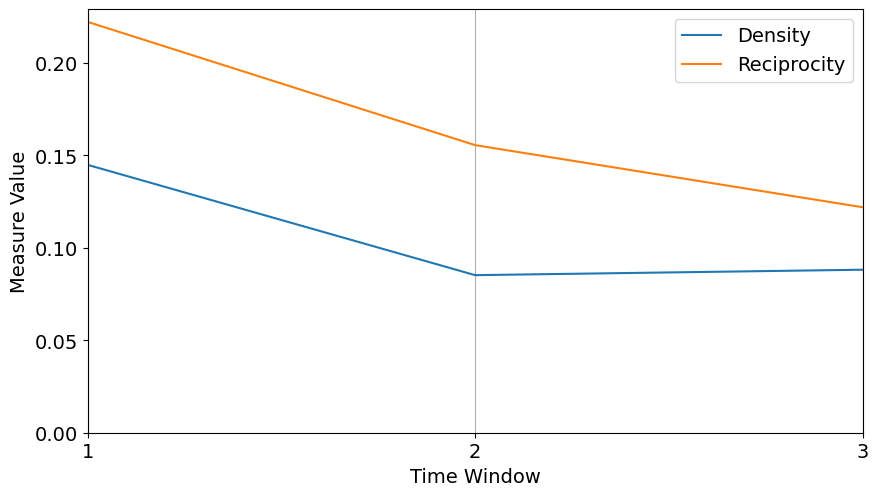

In [117]:
ax = df_stats1.plot(y=["Density", "Reciprocity"], figsize=(10,5.5), fontsize=14)
# specify labels for the axes
ax.set_xlabel("Time Window", fontsize=14)
ax.set_ylabel("Measure Value", fontsize=14)
ax.legend(fontsize=14)
# tweak the appearance of the axes
ax.set_xticks([1, 2, 3])
ax.set_ylim(0)
ax.set_xlim(1, 3)
ax.xaxis.grid();

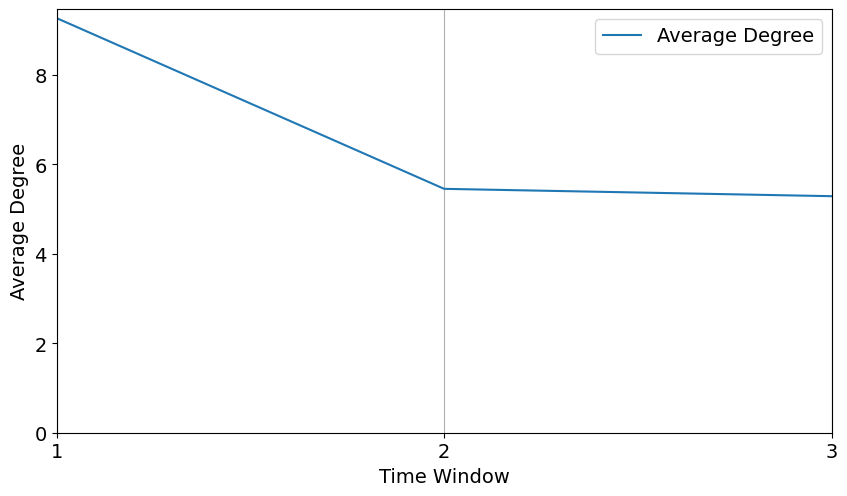

In [118]:
ax = df_stats1["Average Degree"].plot(figsize=(10,5.5), fontsize=14)
# specify labels for the axes
ax.set_xlabel("Time Window", fontsize=14)
ax.set_ylabel("Average Degree", fontsize=14)
ax.legend(fontsize=14)
# tweak the appearance of the axes
ax.set_xticks([1, 2, 3])
ax.set_ylim(0)
ax.set_xlim(1, 3)
ax.xaxis.grid();

Time series analysis of the time windows:
- Time window 1 had the highest density and reciprocity
- Reciprocity is trending negatively
- Density is below 15% for all time windows, each of these time windows are sparse
- Reciprocity is below 25% for all time windows, follows were not often reciprocated within each time window
- The average degree trends negatively
- The max and min average degree is 9.27 and 5.29 respectively 